In [1]:
import jax
jax.config.update("jax_enable_x64", True)


import matplotlib.pyplot as plt
from matplotlib import colormaps, colors

%matplotlib inline
plt.rcParams["image.cmap"] = "inferno"
plt.rcParams["font.family"] = "serif"
plt.rcParams["image.origin"] = "lower"
plt.rcParams["figure.dpi"] = 120

inferno = colormaps["inferno"]
seismic = colormaps["seismic"]

inferno.set_bad("k", 0.5)
seismic.set_bad("k", 0.5)

In [2]:
from amigo.files import get_files
from amigo.files import summarise_files

# Bind file path, type and exposure type
file_fn = lambda **kwargs: get_files(
    [
        "/Users/louis/Data/JWST/amigo_data/CAL04481/calslope/",
    ],
    "calslope",
    EXP_TYPE="NIS_AMI",
    IS_PSF=[True],  # Calibrators
    EXPOSURE=[str(i + 1) for i in range(5)],  # Which sub-pixel position
    **kwargs,
)

files = [] + file_fn(FILTER="F380M") + file_fn(FILTER="F430M") + file_fn(FILTER="F480M")

print(f"\n{len(files)}")
summarise_files(
    files,
    ["TARGPROP", "FILTER", "NINTS", "NGROUPS", "OBSERVTN", "NCHUNKS", "EXPOSURE"],
)

**WARNING**: LOCAL JWST PRD VERSION PRDOPSSOC-063 DOESN'T MATCH THE CURRENT ONLINE VERSION PRDOPSSOC-065
Please consider updating pysiaf, e.g. pip install --upgrade pysiaf or conda update pysiaf



15
  TARGPROP: HD-41094
  FILTER: F480M, F380M, F430M
  NINTS: 760, 905, 1060
  NGROUPS: 11, 20, 30
  OBSERVTN: 001
  NCHUNKS: 1
  EXPOSURE: 5, 1, 3, 4, 2


In [3]:
import jax.numpy as np

for file in files:
    file["SCI"].data[:, :, -1:] = np.nan
    file["SCI_VAR"].data[:, :, -1:] = np.nan
    file["ZPOINT"].data[:, -1:] = np.nan
    file["ZPOINT_VAR"].data[:, -1:] = np.nan

    file["SCI"].data[:, 41:43, 1] = np.nan

In [4]:
import jax.numpy as np
from zodiax.experimental import deserialise
from amigo.files import repopulate
from amigo.core_models import AmigoModel
from amigo.optical_models import AMIOptics
from amigo.detector_models import LinearDetectorModel
from amigo.read_models import ReadModel
from amigo.ramp_models import SimpleRamp, PolyNonLin
from amigo.vis_models import SplineVis
from amigo.files import get_exposures, initialise_params
from amigo.model_fits import SplineVisFit

optics = AMIOptics()
vis_model = SplineVis(optics, x_osamp=3, y_osamp=2)
detector = LinearDetectorModel()
ramp_model = PolyNonLin(orders=[2], norm=1e-3)
read_model = ReadModel()

# Prep the model
fit = SplineVisFit(joint_fit=False)
exposures = get_exposures(files, fit)
params = initialise_params(exposures, optics, vis_model=vis_model)

# Add the binary parameters
model = AmigoModel(
    files,
    params,
    optics=optics,
    detector=detector,
    ramp=ramp_model,
    read=read_model,
    visibilities=vis_model,
)

In [5]:
from amigo.fisher import calc_fishers

params = [
    "positions",
    "aberrations",
    "fluxes",
    "rotation",
    "compression",
    "shear",
    "f2f",
    "holes",
    "dark_current",
    "jitter.r",
    "anisotropy.compression",
    "amplitudes",
    "phases",
    # "shifts",
    # "contrasts",
    "distortion",
]
ramp_model = model.ramp
model = model.set("ramp", None)
fishers = calc_fishers(model, exposures, params, overwrite=True)
model = model.set("ramp", ramp_model)

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/14 [00:00<?, ?it/s]

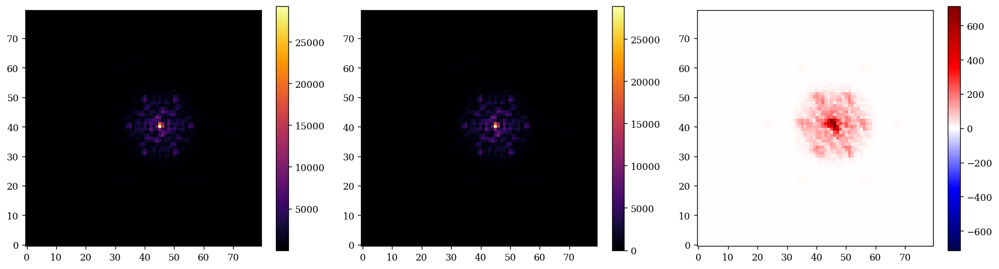

In [6]:
import dLux.utils as dlu
from amigo.ramp_models import build_conv_layers, build_dense_layers, PolyConv

conv_hidden = 64
n_connect = 16
dense_hidden = 32
n_terms = 4
conv_layers = build_conv_layers(conv_hidden=conv_hidden, n_connect=n_connect)
dense_layers = build_dense_layers(n_connect=n_connect, n_hidden=dense_hidden, n_terms=n_terms)

ramp_model = PolyConv(conv_layers, dense_layers, init_scale=0.5)
model = model.set("ramp", ramp_model)

exp = exposures[0]
psf = fit.model_psf(model, exp).data

ngroups = 10
flux = 10 ** model.fluxes[exp.get_key("fluxes")]
ramp = model.ramp.eval_ramp(psf, flux, ngroups)

image = dlu.downsample(flux * psf, 4, mean=False)
res = image - ramp[-1]
v = np.max(np.abs(res))

plt.figure(figsize=(15, 4))
plt.subplot(1, 3, 1)
plt.imshow(image)
plt.colorbar()

plt.subplot(1, 3, 2)
plt.imshow(ramp[-1])
plt.colorbar()

plt.subplot(1, 3, 3)
plt.imshow(res, seismic, vmin=-v, vmax=v)
plt.colorbar()

plt.tight_layout()
plt.show()

In [7]:
def grad_fn(model, grads, args, key):
    if grads.holes is not None:
        grads = grads.set("holes", grads.holes * np.ones((7, 2)).at[:3, :].set(0))
    return grads, key


def norm_fn(model, model_params, args, key):

    # Randomly perturb the ramp values, note the scale should probably be determined
    # by the variance of the present coefficient distribution for each order
    scale = 1e-5
    if "conv.values" in model_params.params.keys():
        params = model_params.params
        key, subkey = jr.split(key, 2)
        vals = params["conv.values"]
        vals += 2 * scale * jr.normal(subkey, vals.shape)
        params["conv.values"] = vals
        model_params = model_params.set("params", params)

    if "dense.values" in model_params.params.keys():
        params = model_params.params
        key, subkey = jr.split(key, 2)
        vals = params["dense.values"]
        vals += scale * jr.normal(subkey, vals.shape)
        params["dense.values"] = vals
        model_params = model_params.set("params", params)

    if "ramp.coeffs" in model_params.params.keys():
        params = model_params.params
        key, subkey = jr.split(key, 2)
        vals = params["ramp.coeffs"]
        vals += 1e-7 * jr.normal(subkey, vals.shape)
        params["ramp.coeffs"] = vals
        model_params = model_params.set("params", params)

    # Normalise the pupil mask compression to have a mean of 1
    if "compression" in model_params.params.keys():
        params = model_params.params
        comp = params["compression"]
        comp -= comp.mean()
        params["compression"] = comp + 1
        model_params = model_params.set("params", params)

    # Normalise the pixel scale compression to have a mean of 1
    if "anisotropy.compression" in model_params.params.keys():
        params = model_params.params
        comp = params["anisotropy.compression"]
        comp -= comp.mean()
        params["anisotropy.compression"] = comp + 1
        model_params = model_params.set("params", params)
    return model_params, key

### TODO: Add SRF to optimised parameters

In [10]:
from amigo.fitting import optimise, sgd, adam
import jax.random as jr

batch_size = 1
exposures_in = exposures
if batch_size > len(exposures_in):
    batch_size = len(exposures_in)
nbatch = len(exposures_in) // batch_size
if len(exposures_in) % batch_size != 0:
    nbatch += 1

optimisers = {
    "positions": sgd(5e-1, 0),
    "aberrations": sgd(1e-1, 5),
    "fluxes": sgd(2e-1, 5),
    "dark_current": sgd(2e-1, 10),
    "conv.values": adam((5e-4) / batch_size, 15 * nbatch),
    "dense.values": adam((5e-4) / batch_size, 15 * nbatch),
    "jitter.r": sgd(5e-1, 50),
    "f2f": sgd(2e-1, 100),
    "distortion": sgd(1e-1, 100),
    # "anisotropy.compression": sgd(5e-2, 100),
    "amplitudes": sgd(2e-2, 200),
    "phases": sgd(2e-2, 200),
}

# Optimisation
final_model, losses, histories, states = optimise(
    model,
    exposures_in,
    optimisers,
    epochs=750,
    key=jr.PRNGKey(0),
    fishers=fishers,
    grad_fn=grad_fn,
    norm_fn=norm_fn,
    print_grads=False,
    batch_size=batch_size,
    batch_params=["conv.values", "dense.values"],
)

  0%|          | 0/750 [00:00<?, ?it/s]

Grad Batch fn compiling...
Compiling update function
Grad Batch fn compiling...
Grad Batch fn compiling...
Grad Batch fn compiling...
Grad Batch fn compiling...
Grad Batch fn compiling...
Grad Batch fn compiling...
Grad Batch fn compiling...
Grad Batch fn compiling...
Grad Batch fn compiling...
Grad Batch fn compiling...
Grad Batch fn compiling...
Grad Batch fn compiling...
Grad Batch fn compiling...
Grad Batch fn compiling...
Compiling update function
Compile Time: 0:02:38
Initial Loss: 5,585.73
Est time per epoch:  0:00:42
Est run remaining:  8:51:33
Full Time: 8:43:53
Final Loss: 14.13


14.13053283404691 [13.77150971 19.28335365  9.48090506 10.18132289 13.02317109 13.50849647
 13.55224981 19.52074376 14.18859742 19.20625078  9.88008904  9.38744893
 19.01586416 18.46429719  9.49369254]


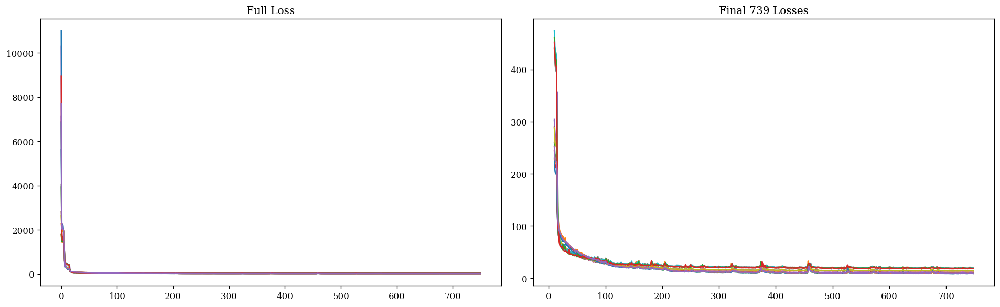

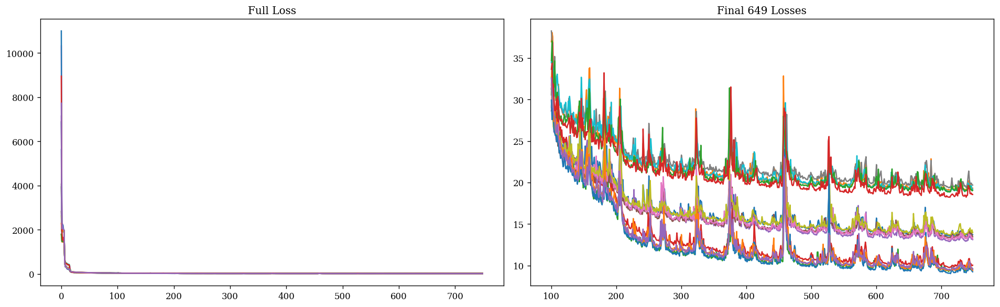

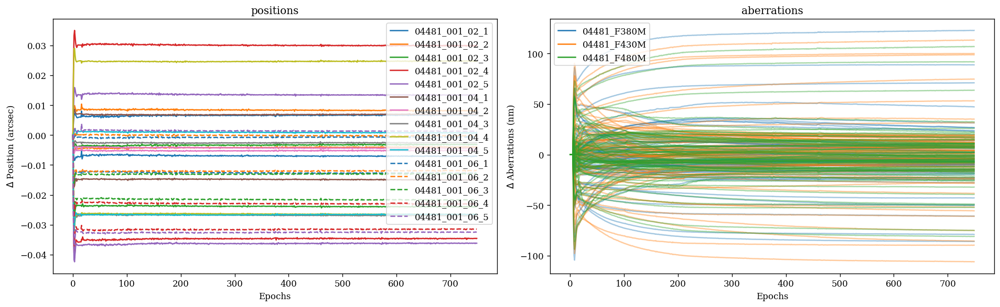

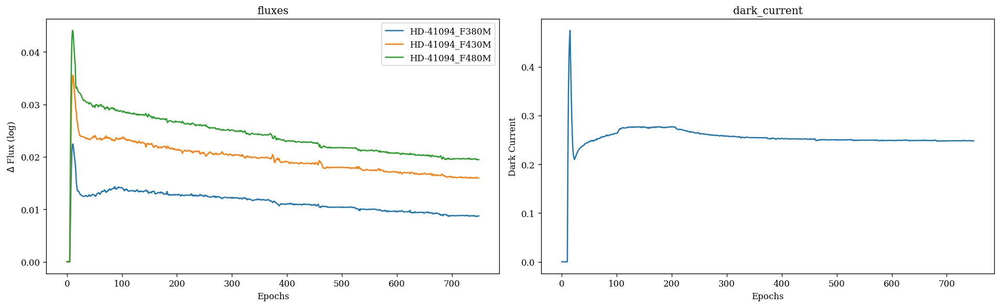

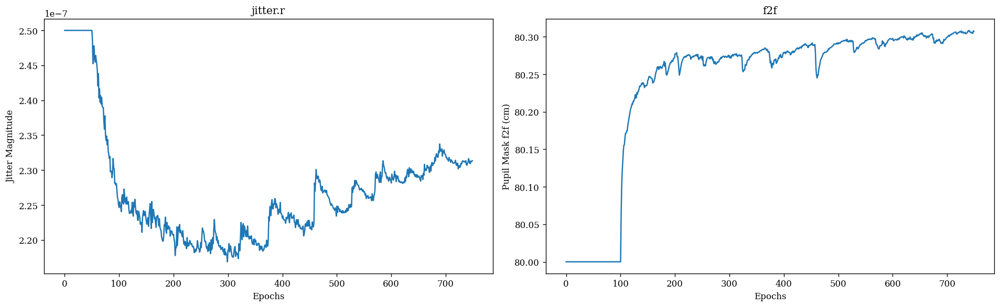

No formatting function for distortion


2024-07-27 11:00:38,416 - stpipe - WARNING - /Users/louis/mambaforge/envs/amigo/lib/python3.11/site-packages/amigo/plotting.py:291: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
2024-07-27 11:00:38,417 - stpipe - WARNING -   plt.tight_layout()
2024-07-27 11:00:38,417 - stpipe - WARNING - 
2024-07-27 11:00:40,957 - stpipe - WARNING - /Users/louis/mambaforge/envs/amigo/lib/python3.11/site-packages/IPython/core/pylabtools.py:152: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
2024-07-27 11:00:40,957 - stpipe - WARNING -   fig.canvas.print_figure(bytes_io, **kw)
2024-07-27 11:00:40,958 - stpipe - WARNING - 


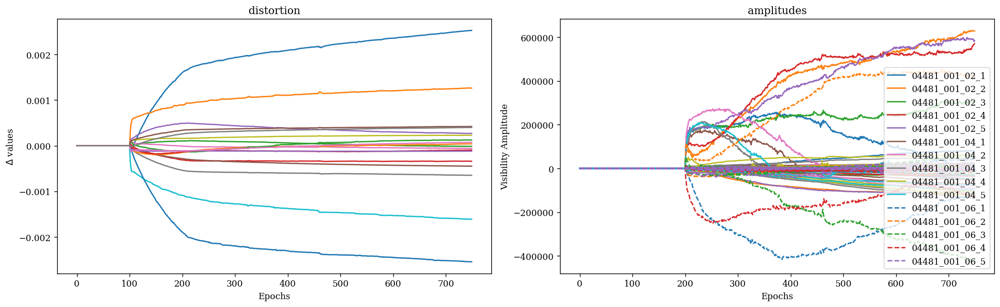

2024-07-27 11:01:08,901 - stpipe - WARNING - /Users/louis/mambaforge/envs/amigo/lib/python3.11/site-packages/amigo/plotting.py:283: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
2024-07-27 11:01:08,901 - stpipe - WARNING -   plt.tight_layout()
2024-07-27 11:01:08,902 - stpipe - WARNING - 


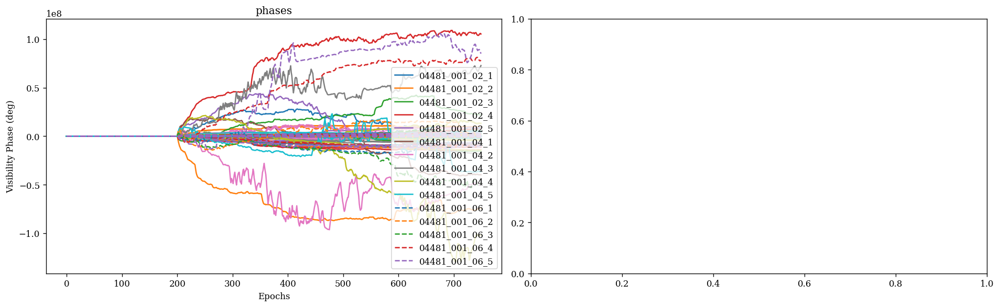

No formatting function for conv.values
No formatting function for dense.values


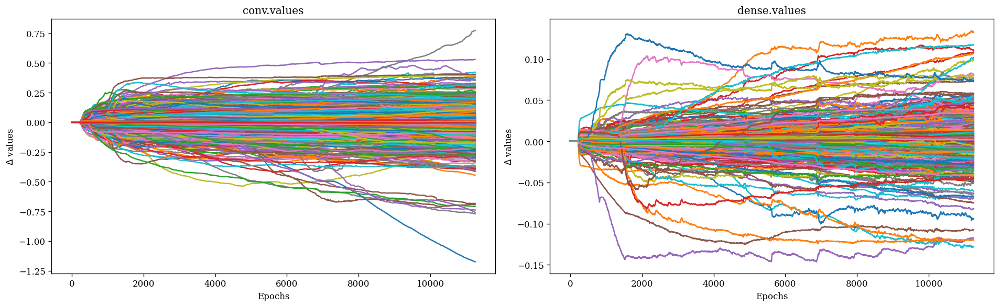

In [11]:
from amigo.plotting import plot, plot_losses

print(losses[-1].mean(), losses[-1])

end = -1
plot_losses(losses, start=10, stop=end)
plot_losses(losses, start=100, stop=end)

for history in histories:
    plot(history, end=end)

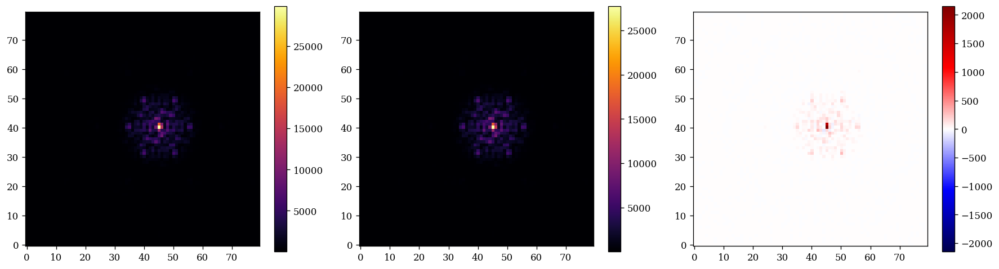

In [12]:
# print(conv)
exp = exposures[0]
# psf = 

flux = 10 ** final_model.fluxes[exp.get_key("fluxes")]
ngroups = 10
ramp = final_model.ramp.apply(fit.model_psf(model, exp), flux, exp, 4).data
# ramp = final_model.ramp.eval_ramp_interp(psf, flux, ngroups)

image = dlu.downsample(flux * psf, 4, mean=False)
res = image - ramp[-1]
v = np.max(np.abs(res))

plt.figure(figsize=(15, 4))
plt.subplot(1, 3, 1)
plt.imshow(image)
plt.colorbar()

plt.subplot(1, 3, 2)
plt.imshow(ramp[-1])
plt.colorbar()

plt.subplot(1, 3, 3)
plt.imshow(res, seismic, vmin=-v, vmax=v)
plt.colorbar()

plt.tight_layout()
plt.show()

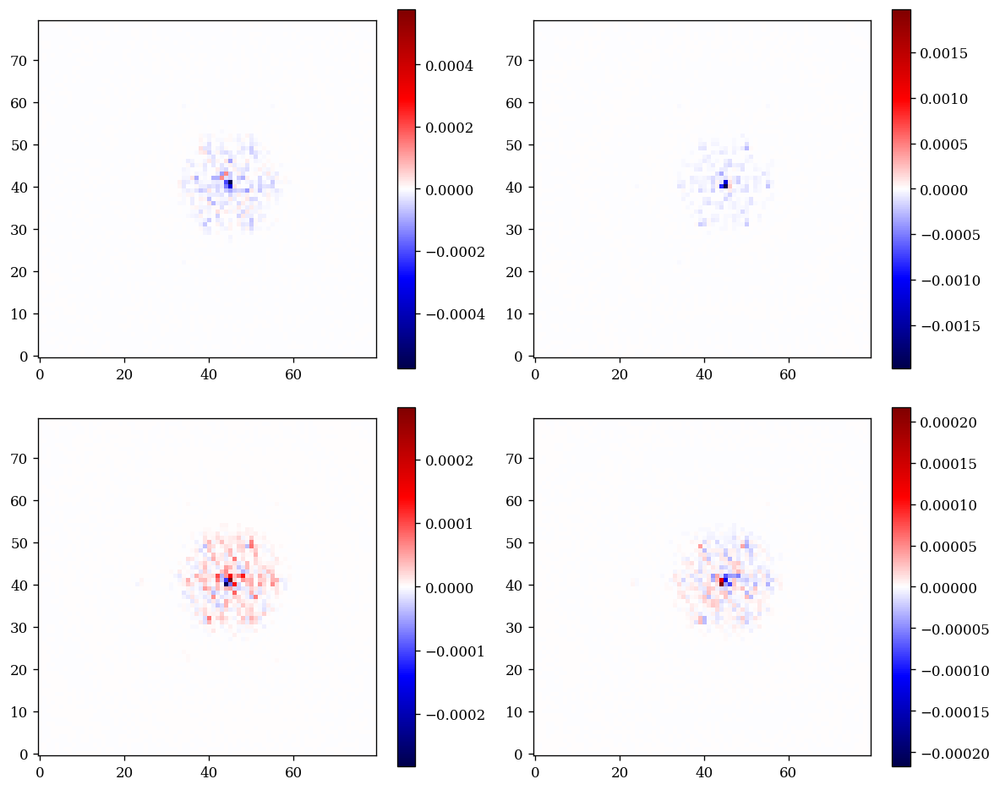

In [16]:
from jax import vmap
from amigo.ramp_models import build_image_basis

psf = fit.model_psf(final_model, exposures[0]).data

# Predict the polynomial coefficients
norm_basis = vmap(lambda arr: arr / np.max(np.abs(arr)))
conv_coeffs = final_model.ramp.conv(norm_basis(build_image_basis(psf)))
# print(conv_coeffs.shape)


def apply_linear(x, layers):
    for layer in layers[:-1]:
        # print(x.shape)
        x = jax.nn.relu(layer(x))
    return layers[-1](x)


vmap_fn = lambda fn: lambda x: vmap(vmap(fn, 1, 1), 2, 2)(x)
layers = [vmap_fn(layer) for layer in final_model.ramp.dense._layers]
coeffs = apply_linear(conv_coeffs, layers)

plt.figure(figsize=(10, 8))
for i in range(len(coeffs)):
    plt.subplot(2, 2, i + 1)
    v = np.max(np.abs(coeffs[i]))
    plt.imshow(coeffs[i], seismic, vmin=-v, vmax=v)
    plt.colorbar()

plt.tight_layout()
plt.show()

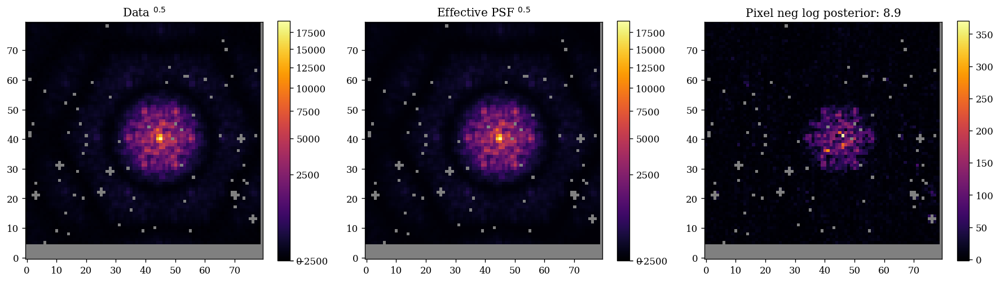

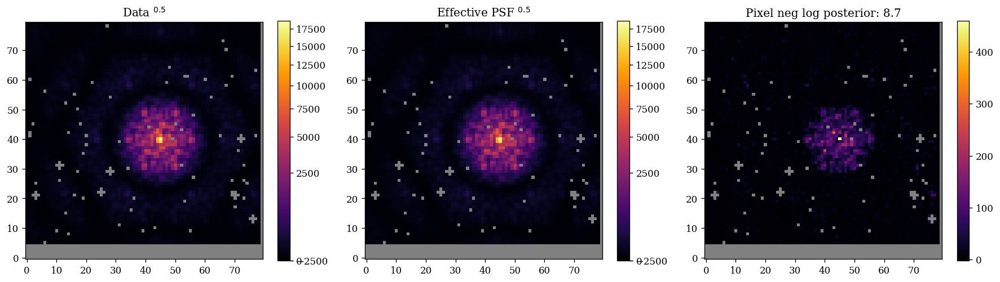

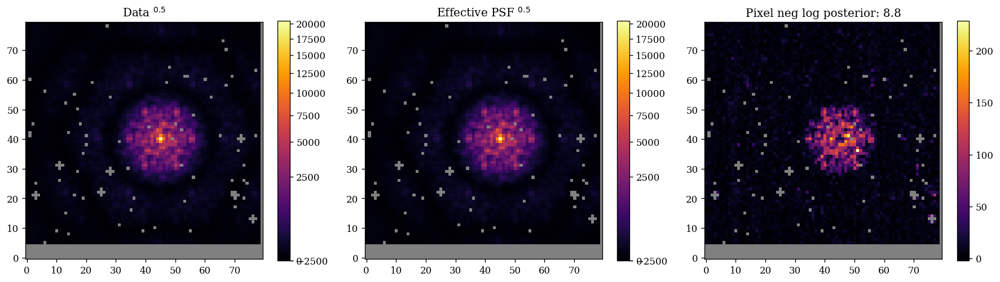

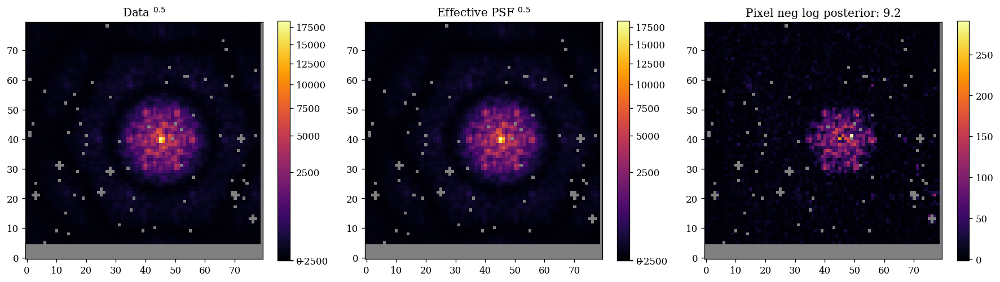

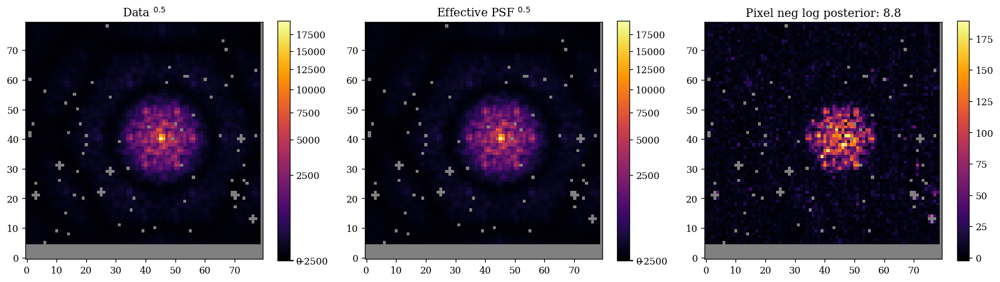

...

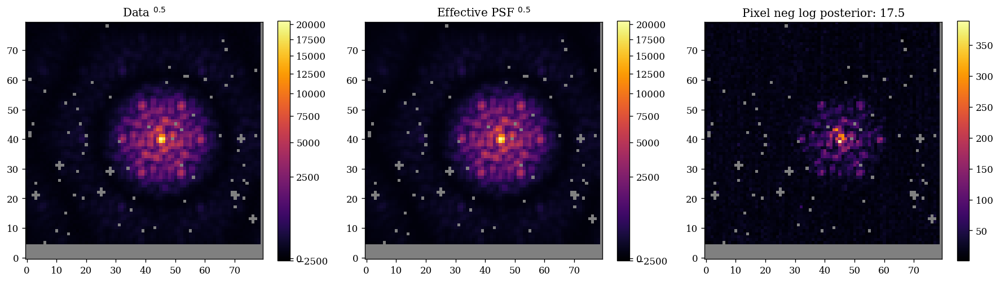

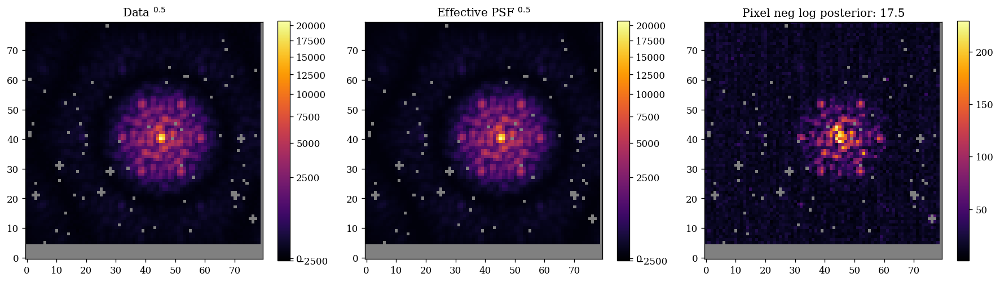

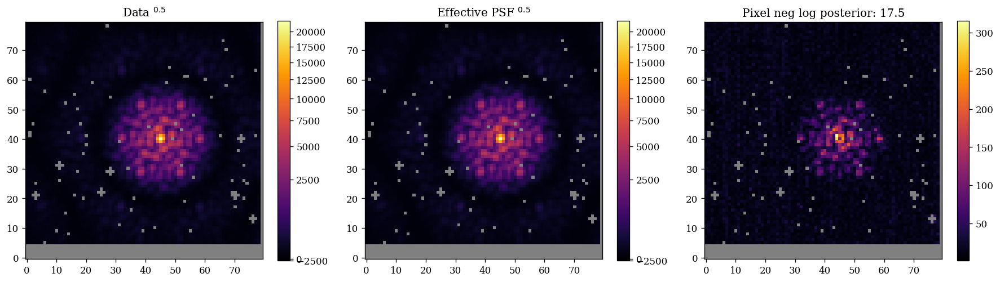

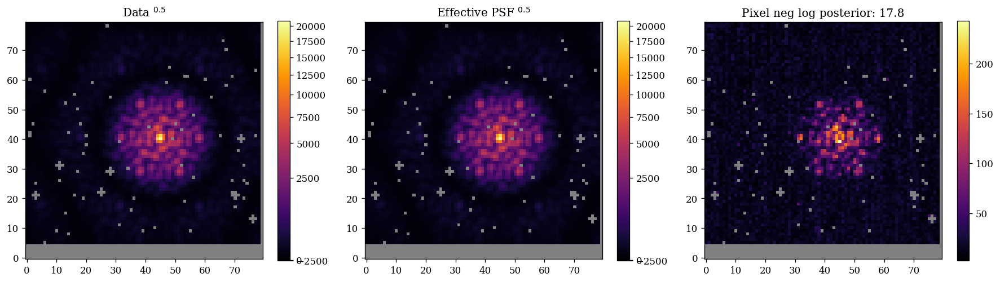

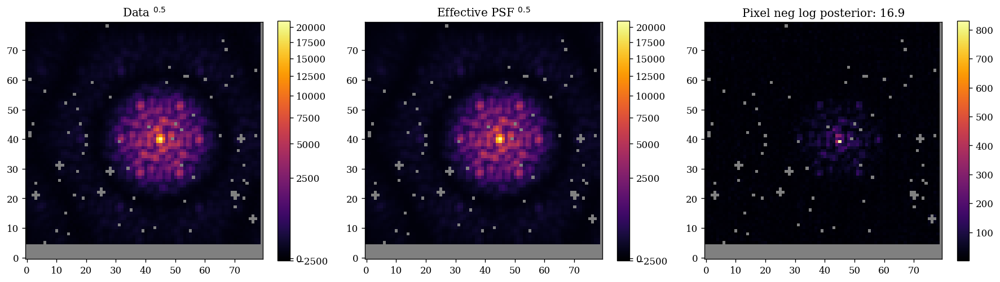

In [15]:
from amigo.plotting import summarise_fit

for exp in exposures_in:
    summarise_fit(
        exp,
        final_model,
        residuals=True,
    )

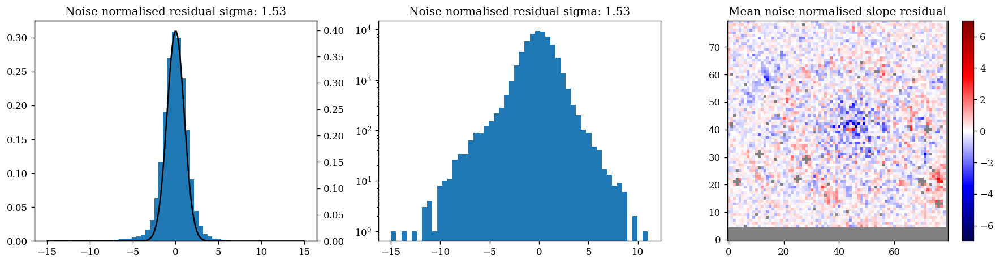

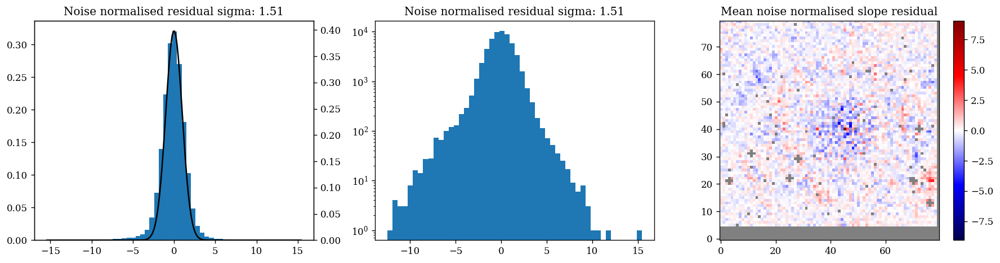

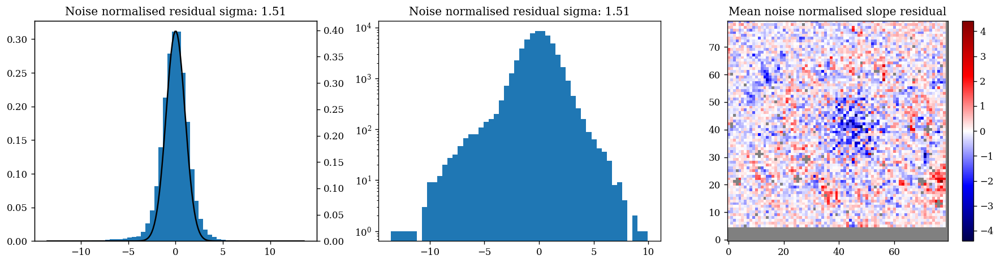

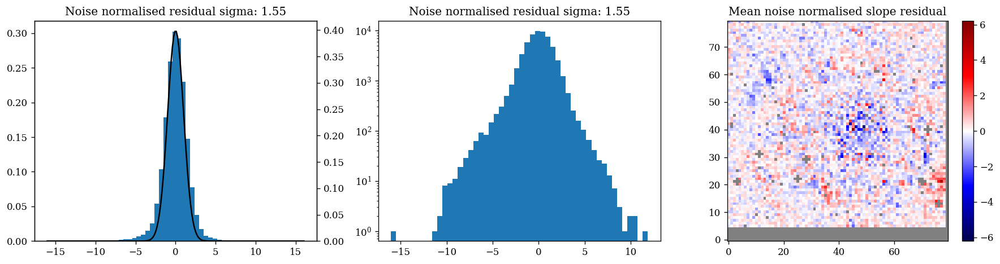

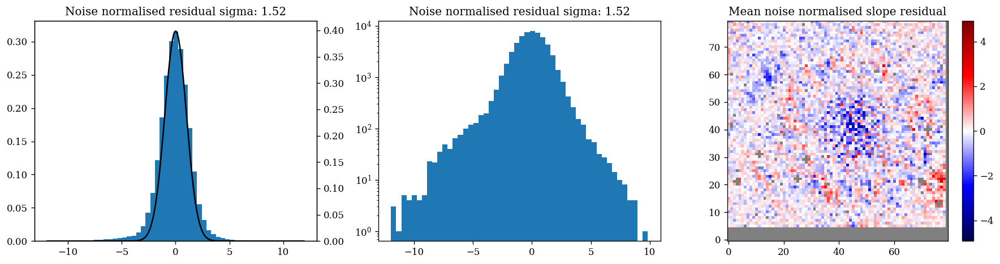

...

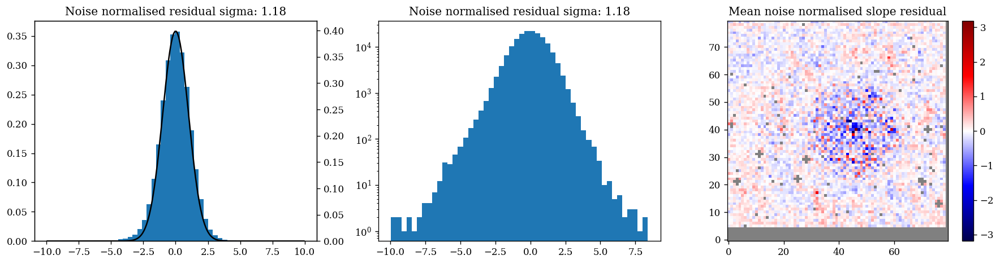

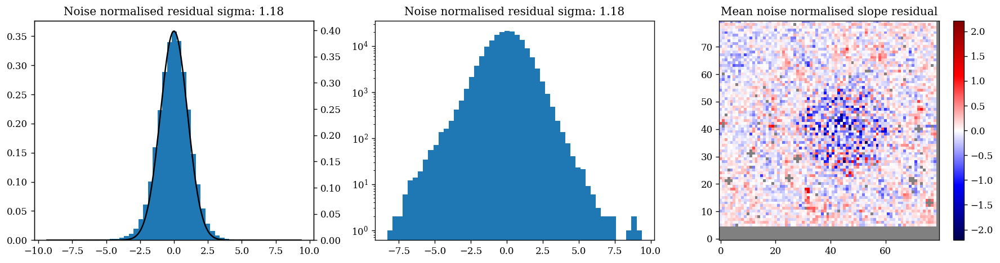

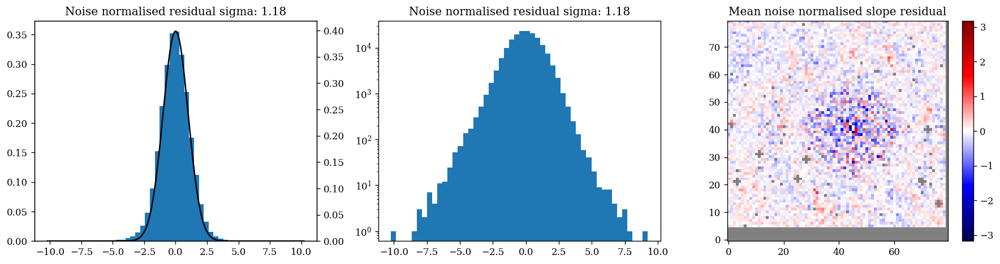

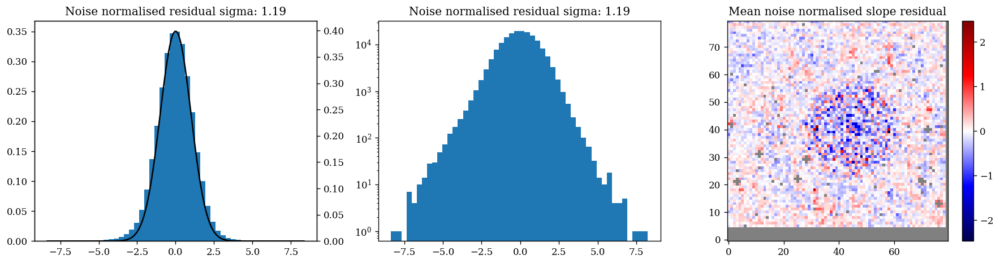

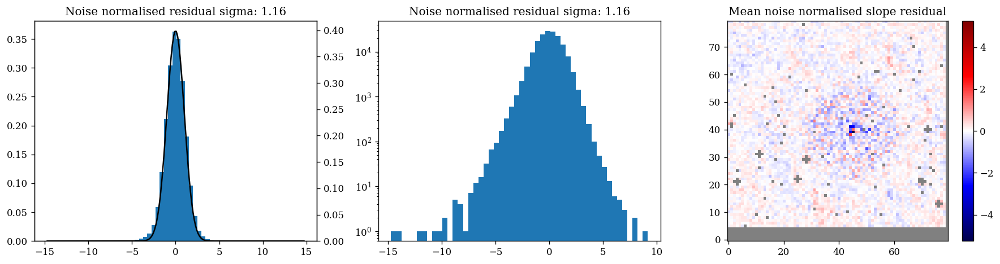

In [17]:
for exp in exposures_in:
    summarise_fit(
        exp,
        final_model,
        histograms=True,
    )

In [148]:
# from amigo.plotting import summarise_fit

# for exp in exposures_in:
#     summarise_fit(
#         exp,
#         final_model,
#         up_the_ramp_norm=True,
#     )

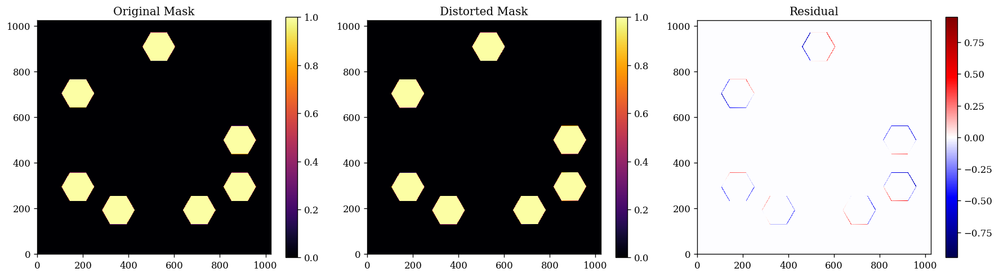

In [79]:
orig_mask = model.calc_mask(optics.wf_npixels, optics.diameter)
distorted = final_model.calc_mask(optics.wf_npixels, optics.diameter)
res = orig_mask - distorted
v = np.max(np.abs(res))

plt.figure(figsize=(15, 4))
plt.subplot(1, 3, 1)
plt.title("Original Mask")
plt.imshow(orig_mask)
plt.colorbar()

plt.subplot(1, 3, 2)
plt.title("Distorted Mask")
plt.imshow(distorted)
plt.colorbar()

plt.subplot(1, 3, 3)
plt.title("Residual")
plt.imshow(res, seismic, vmin=-v, vmax=v)
plt.colorbar()

plt.tight_layout()
plt.show()

Pipeline measured variance


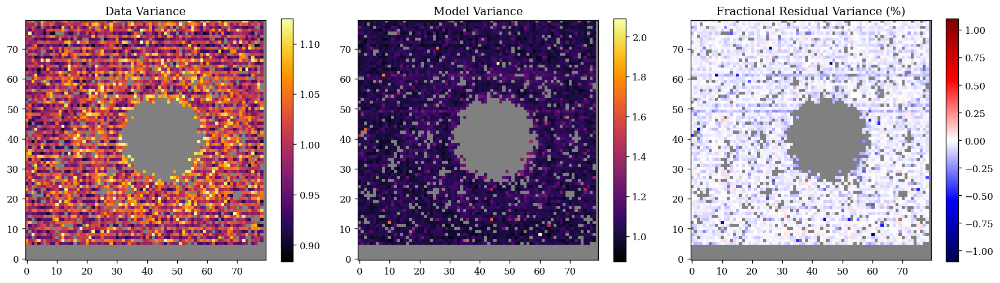

Model estimated variance
0.0015284306775537515


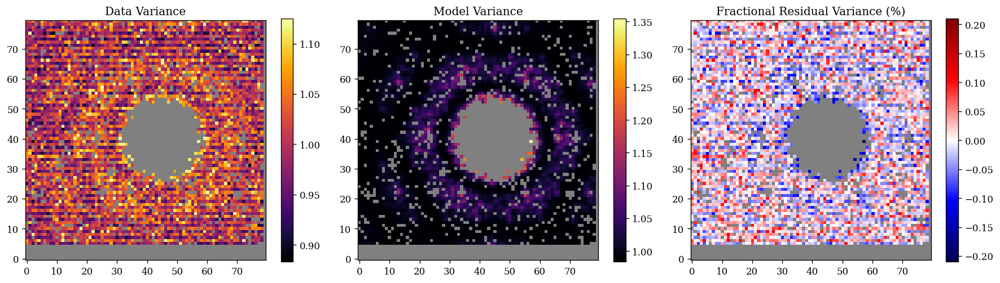

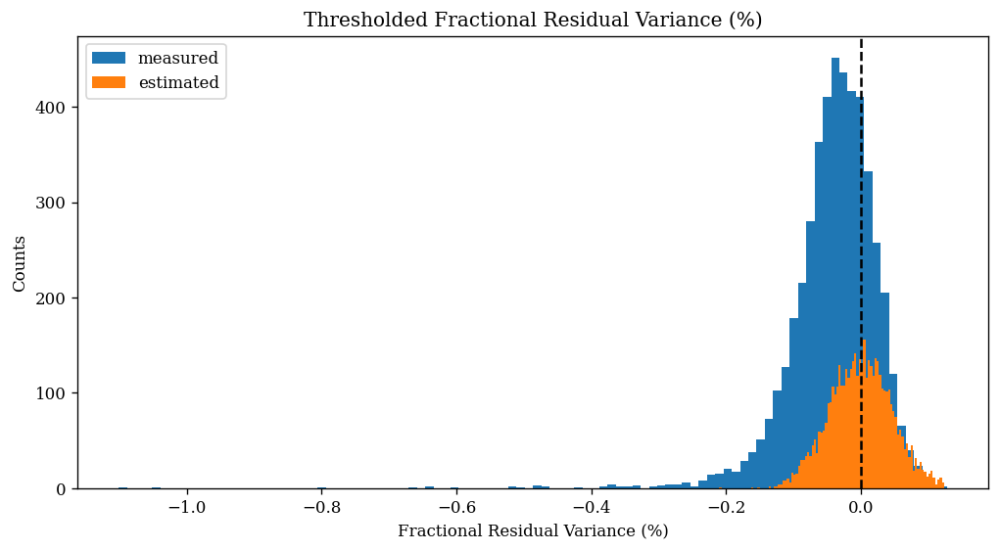

In [147]:
from amigo.modelling import variance_model

exp = exposures[0]
k = 1.125

slopes, var = variance_model(final_model, exposures_in[0], true_read_noise=True)
print("Pipeline measured variance")
data_var = exp.variance.sum(0)
data_var = np.where(data_var > k, np.nan, data_var)
model_var = var.sum(0)
model_var = np.where(np.isnan(data_var), np.nan, model_var)
res = data_var - model_var
# frac_res1 = 100 * res / data_var
frac_res1 = res / data_var
v = np.nanmax(np.abs(frac_res1))

plt.figure(figsize=(15, 4))
plt.subplot(1, 3, 1)
plt.title("Data Variance")
plt.imshow(data_var, inferno)
plt.colorbar()

plt.subplot(1, 3, 2)
plt.title("Model Variance")
plt.imshow(model_var, inferno)
plt.colorbar()

plt.subplot(1, 3, 3)
plt.title("Fractional Residual Variance (%)")
plt.imshow(frac_res1, seismic, vmin=-v, vmax=v)
plt.colorbar()

plt.tight_layout()
plt.show()

slopes, var = variance_model(final_model, exposures_in[0], read_noise=10.2)
print("Model estimated variance")
model_var = var.sum(0)
# model_var -= 0.03771073514025311
# model_var += 0.03964163822472337
model_var = np.where(np.isnan(data_var), np.nan, model_var)
res = data_var - model_var
print(np.nanmean(res))
# frac_res2 = 100 * res / data_var
frac_res2 = res / data_var

v = np.nanmax(np.abs(frac_res2))

plt.figure(figsize=(15, 4))
plt.subplot(1, 3, 1)
plt.title("Data Variance")
plt.imshow(data_var, inferno)
plt.colorbar()

plt.subplot(1, 3, 2)
plt.title("Model Variance")
plt.imshow(model_var, inferno)
plt.colorbar()

plt.subplot(1, 3, 3)
plt.title("Fractional Residual Variance (%)")
plt.imshow(frac_res2, seismic, vmin=-v, vmax=v)
plt.colorbar()

plt.tight_layout()
plt.show()

plt.figure(figsize=(10, 5))
plt.title("Thresholded Fractional Residual Variance (%)")
plt.xlabel("Fractional Residual Variance (%)")
plt.ylabel("Counts")
plt.hist(frac_res1.flatten(), bins=100, label='measured')
plt.hist(frac_res2.flatten(), bins=100, label='estimated')
plt.axvline(0, color="k", linestyle="--")
plt.legend()
plt.show()

File 04481_001_04_3
Star HD-41094
Filter F380M
nints 1060
ngroups 11



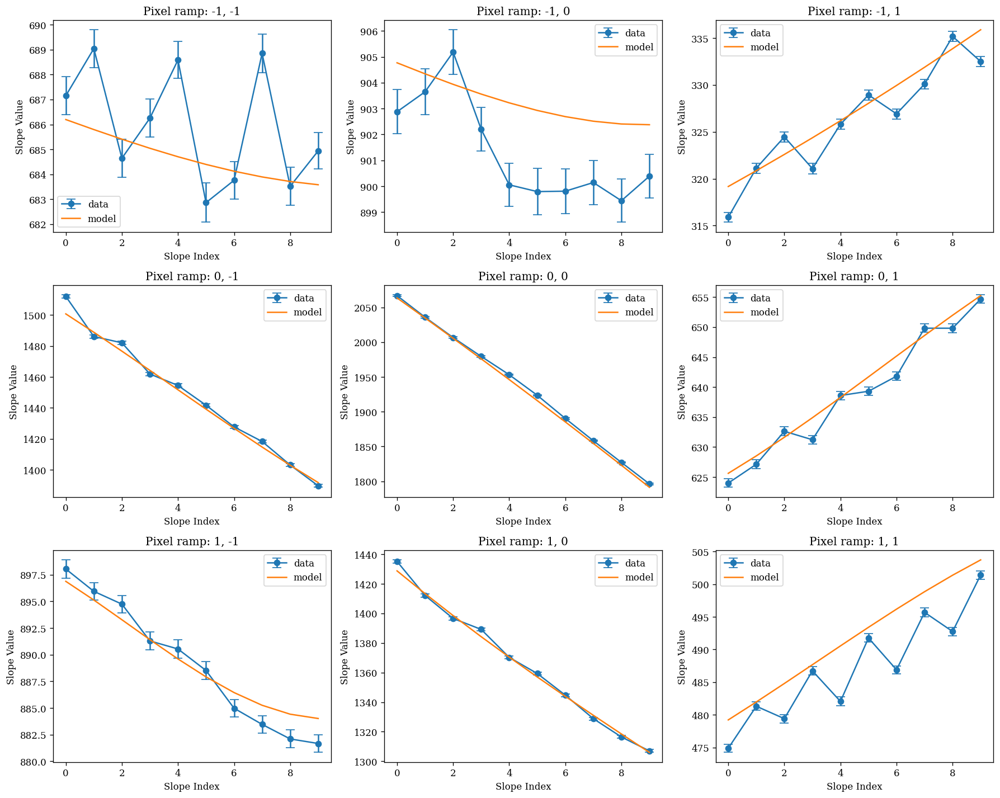

File 04481_001_06_1
Star HD-41094
Filter F430M
nints 905
ngroups 20



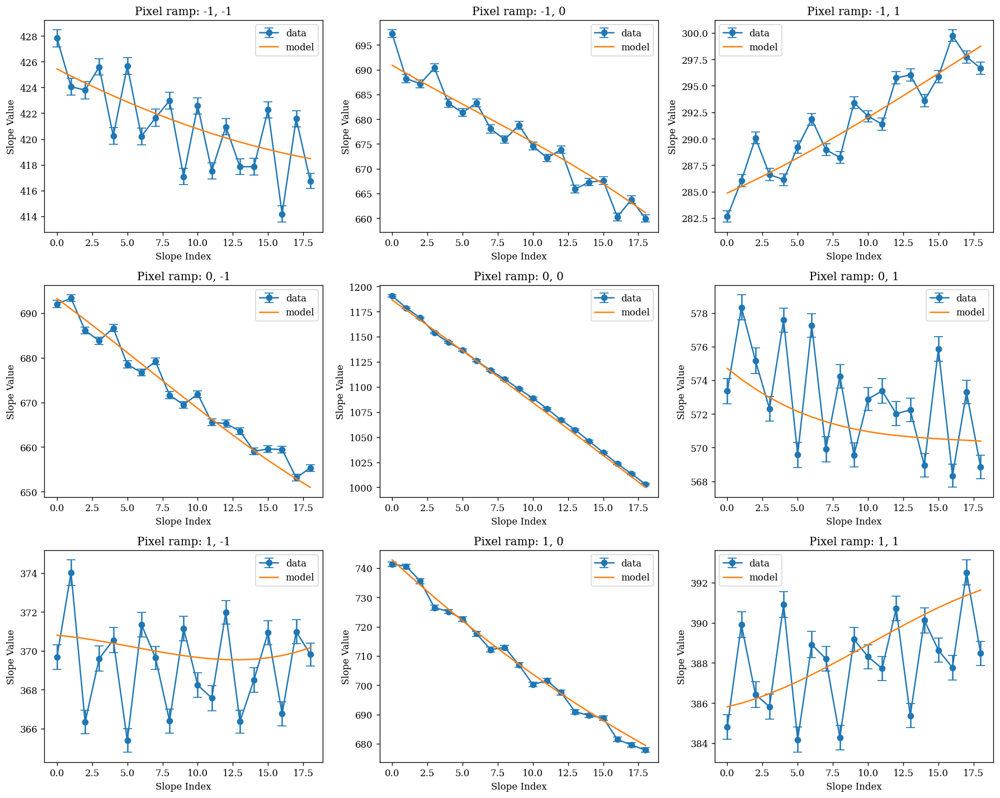

File 04481_001_02_5
Star HD-41094
Filter F480M
nints 760
ngroups 30



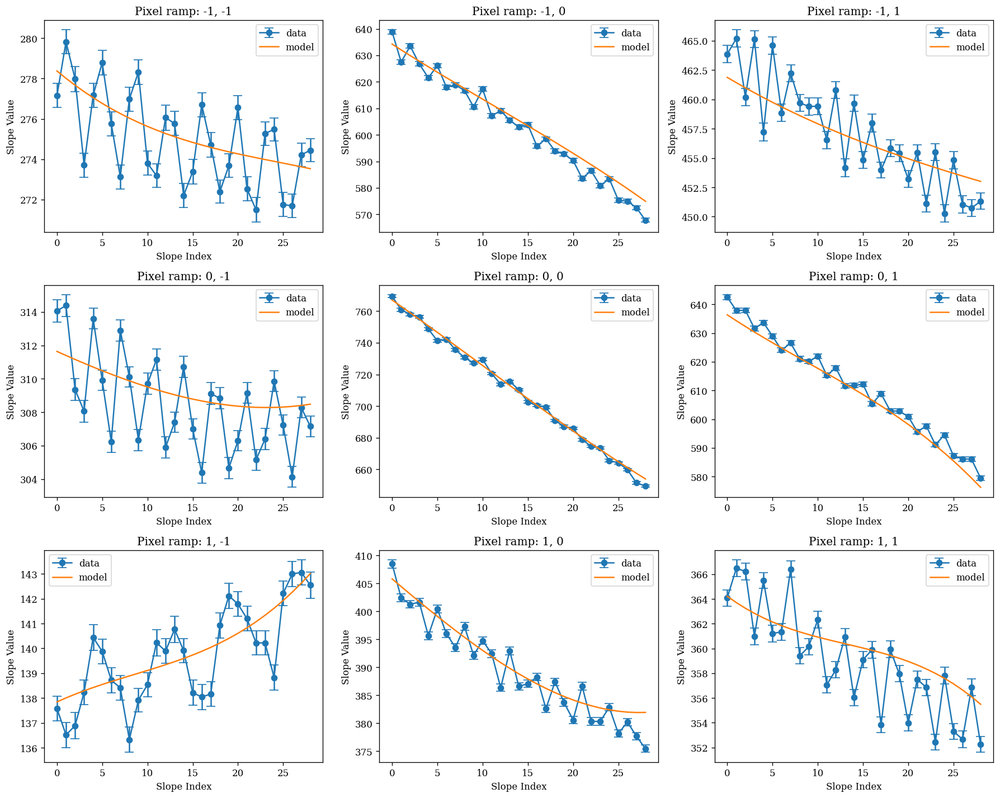

In [70]:
cols = [
    "tab:blue",
    "tab:orange",
    "tab:green",
    "tab:red",
    "tab:purple",
    "tab:brown",
    "tab:pink",
    "tab:gray",
    "tab:olive",
    "tab:cyan",
]


for idx, exp in enumerate(exposures[::5]):
    exp.print_summary()
    index = idx % len(cols)

    n = 1
    k = 2 * n + 1
    plt.figure(figsize=(5 * k, 4 * k))

    slopes = final_model.model(exp)
    im = slopes.sum(0)
    peak_map = im == np.nanmax(im)
    peak_map = convert_adjacent_to_true(peak_map, corners=True, n=n)
    
    ind = np.where(peak_map)
    model_slopes = slopes[:, *ind].reshape(-1, k, k)
    data_slopes = exp.slopes[:, *ind].reshape(-1, k, k)
    data_std = exp.variance[:, *ind].reshape(-1, k, k) ** 0.5

    xs = np.arange(len(slopes))
    ymin, ymax = 0, np.nanmax(np.array([data_slopes, model_slopes]))

    for i in range(k):
        for j in range(k):
            plt.subplot(k, k, i * k + j + 1)
            plt.errorbar(
                xs, data_slopes[:, i, j], yerr=data_std[:, i, j], marker='o', capsize=5, label='data'
            )
            plt.errorbar(xs, model_slopes[:, i, j], label='model')
            plt.title(f"Pixel ramp: {i - n}, {j - n}")
            plt.xlabel("Slope Index")
            plt.ylabel("Slope Value")
            plt.legend()


    plt.tight_layout()
    plt.show()

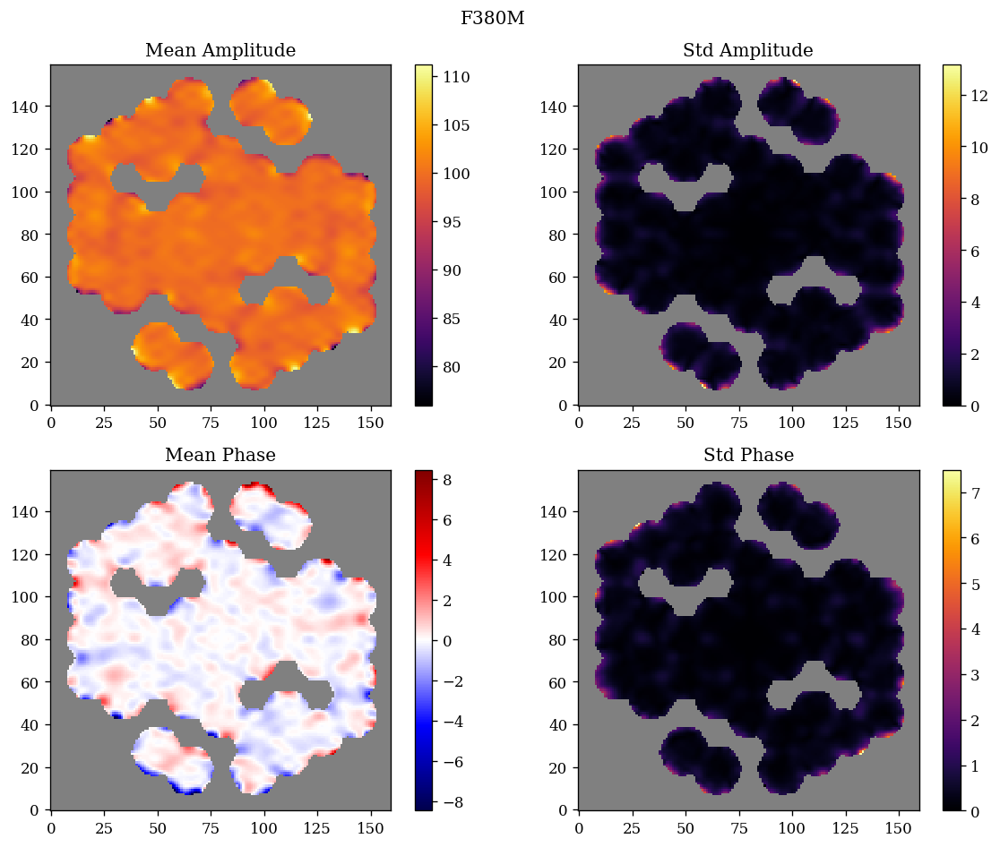

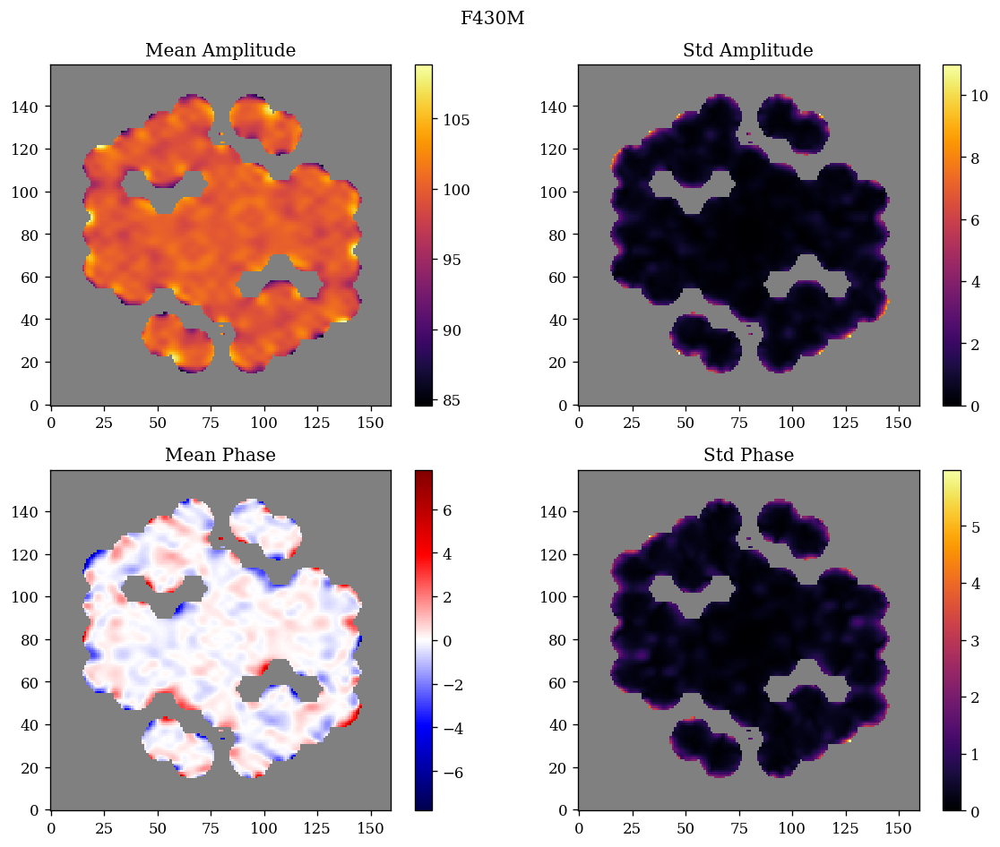

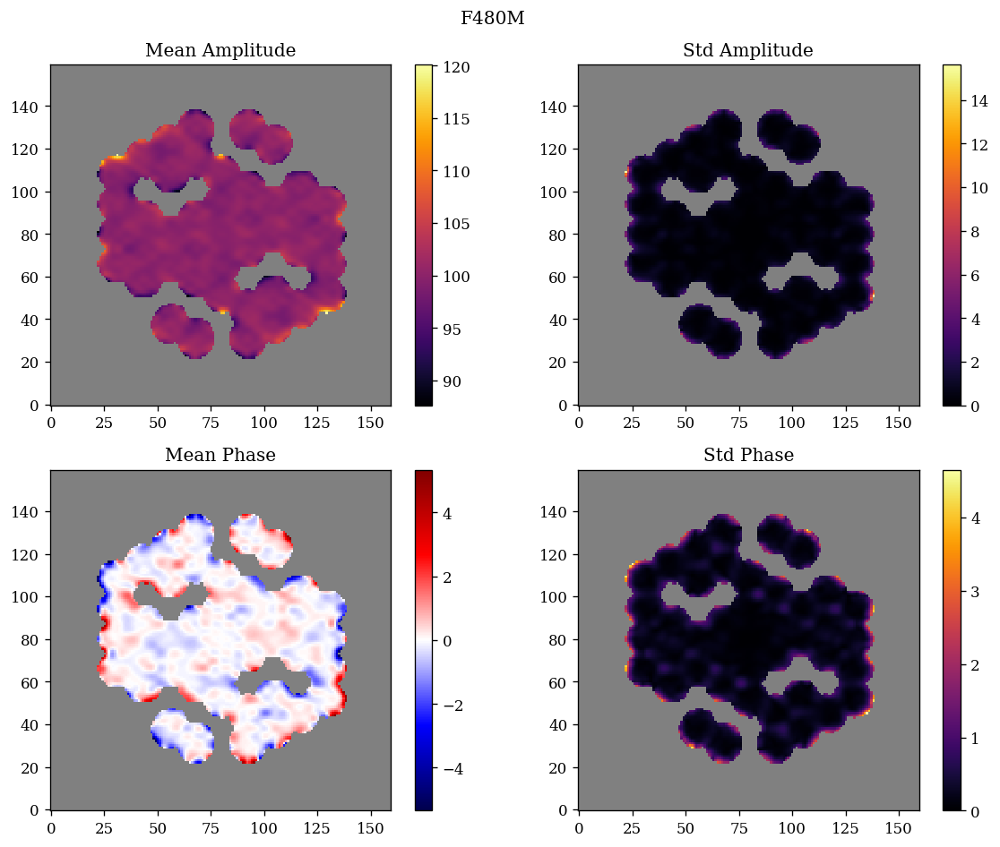

In [28]:
import dLux.utils as dlu
from amigo.interferometry import to_uv

filts = []
vis_maps = {
    'F380M': [],
    'F430M': [],
    'F480M': [],
}
for exp in exposures:

    psf = fit.model_wfs(model, exp).psf.sum(0)
    padded = dlu.resize(psf, exp.fit.uv_pad * len(psf))
    splodges = np.abs(dlu.resize(to_uv(padded), exp.fit.crop_size))
    mask = splodges > 1e-3
    vis_map = np.where(mask, exp.fit.get_vis_map(final_model, exp), np.nan)
    vis_maps[exp.filter].append(vis_map)

for filt in vis_maps.keys():
    amplitudes = np.abs(np.array(vis_maps[filt]))
    amp_map = np.nanmean(amplitudes, axis=0)
    amp_map_std = np.nanstd(amplitudes, axis=0)

    phases = dlu.rad2deg(np.angle(np.array(vis_maps[filt])))
    pha_map = np.nanmean(phases, axis=0)
    pha_map_std = np.nanstd(phases, axis=0)

    plt.figure(figsize=(10, 8))
    plt.suptitle(filt)
    plt.subplot(2, 2, 1)
    plt.title("Mean Amplitude")
    plt.imshow(100 * amp_map, inferno)
    plt.colorbar()

    plt.subplot(2, 2, 2)
    plt.title("Std Amplitude")
    plt.imshow(100 * amp_map_std, inferno)
    plt.colorbar()

    plt.subplot(2, 2, 3)
    plt.title("Mean Phase")
    plt.imshow(pha_map, seismic)
    plt.colorbar()

    plt.subplot(2, 2, 4)
    plt.title("Std Phase")
    plt.imshow(pha_map_std, inferno)
    plt.colorbar()

    plt.tight_layout()
    plt.show()

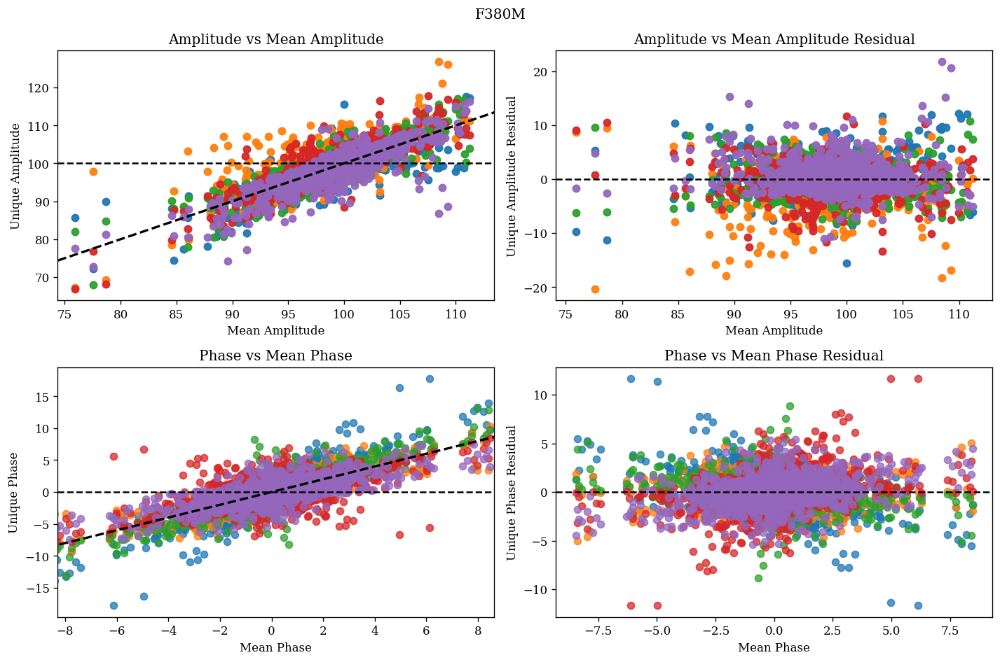

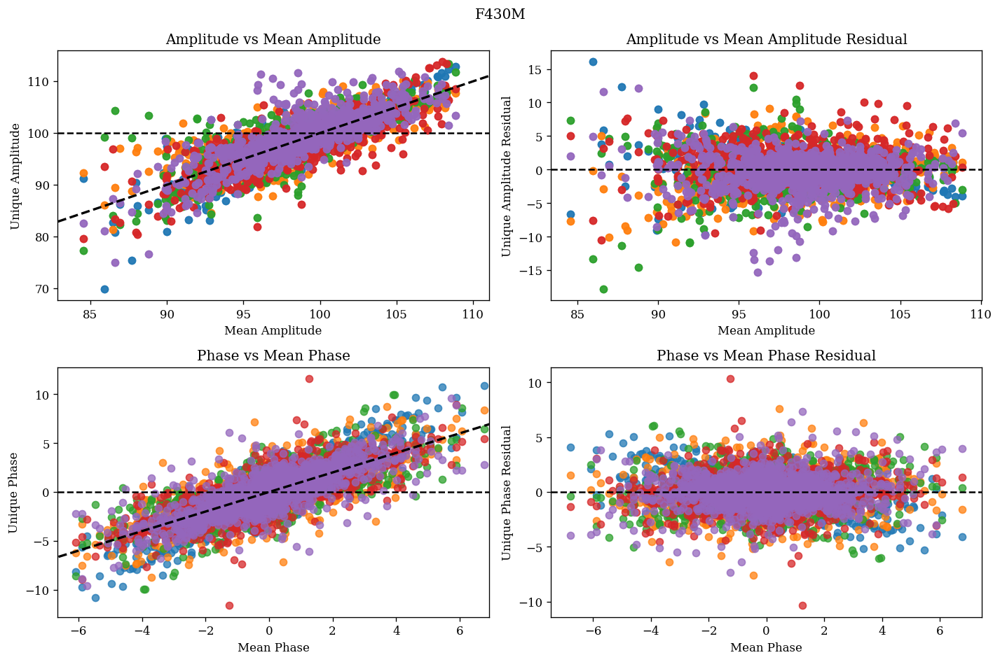

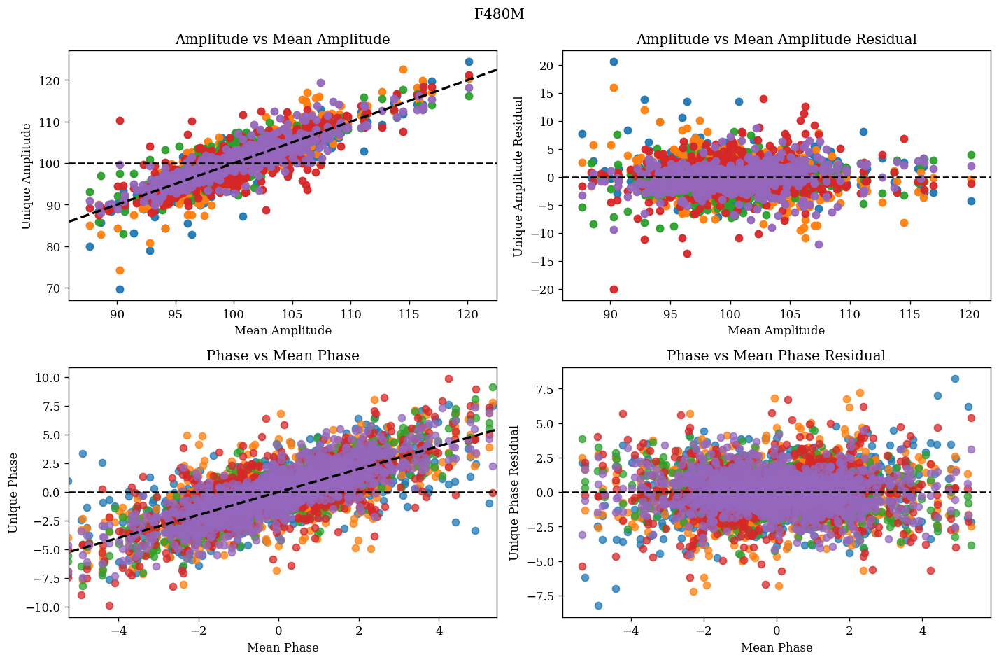

In [109]:
import dLux.utils as dlu
from amigo.interferometry import to_uv

splodges_in = {
    "F380M": [],
    "F430M": [],
    "F480M": [],
}
filt_exps = {
    "F380M": [],
    "F430M": [],
    "F480M": [],
}
for exp in exposures:
    filt_exps[exp.filter].append(exp)
    psf = fit.model_wfs(model, exp).psf.sum(0)
    padded = dlu.resize(psf, exp.fit.uv_pad * len(psf))
    splodges = np.abs(dlu.resize(to_uv(padded), exp.fit.crop_size))
    splodges_in[exp.filter].append(splodges)

flat_vis_maps = {
    "F380M": [],
    "F430M": [],
    "F480M": [],
}
for filt, splodges in splodges_in.items():
    mask = np.abs(np.array(splodges)).mean(0) > 1e-3
    for i in range(len(splodges)):
        exp = filt_exps[filt][i]
        vis_map = exp.fit.get_vis_map(final_model, exp)
        vis_map = vis_map[*np.where(mask)]
        flat_vis_maps[filt].append(vis_map)

for filt in flat_vis_maps.keys():
    amplitudes = 100 * np.abs(np.array(flat_vis_maps[filt]))
    phases = dlu.rad2deg(np.angle(np.array(flat_vis_maps[filt])))
    mean_amp = np.nanmean(amplitudes, axis=0)
    mean_pha = np.nanmean(phases, axis=0)

    min_val, max_val = np.min(amplitudes), np.max(amplitudes)

    plt.figure(figsize=(12, 8))
    plt.suptitle(filt)
    plt.subplot(2, 2, 1)
    plt.title("Amplitude vs Mean Amplitude")
    for i in range(len(amplitudes)):
        plt.scatter(mean_amp, amplitudes[i], alpha=0.75)
    plt.xlabel("Mean Amplitude")
    plt.ylabel("Unique Amplitude")
    plt.axhline(100, c='k', ls='--')
    plt.plot([min_val, max_val], [min_val, max_val], 'k--', lw=2)
    plt.xlim(0.98 * mean_amp.min(), 1.02 * mean_amp.max())


    plt.subplot(2, 2, 2)
    plt.title("Amplitude vs Mean Amplitude Residual")
    for i in range(len(amplitudes)):
        plt.scatter(mean_amp, mean_amp - amplitudes[i], alpha=0.75)
    plt.xlabel("Mean Amplitude")
    plt.ylabel("Unique Amplitude Residual")
    plt.axhline(0, c='k', ls='--')


    min_val, max_val = np.min(phases), np.max(phases)

    plt.subplot(2, 2, 3)
    plt.title("Phase vs Mean Phase")
    for i in range(len(phases)):
        plt.scatter(mean_pha, phases[i], alpha=0.75)
    plt.xlabel("Mean Phase")
    plt.ylabel("Unique Phase")
    plt.axhline(0, c='k', ls='--')
    plt.plot([min_val, max_val], [min_val, max_val], 'k--', lw=2)
    plt.xlim(0.98 * mean_pha.min(), 1.02 * mean_pha.max())



    plt.subplot(2, 2, 4)
    plt.title("Phase vs Mean Phase Residual")
    for i in range(len(phases)):
        plt.scatter(mean_pha, mean_pha - phases[i], alpha=0.75)
    plt.xlabel("Mean Phase")
    plt.ylabel("Unique Phase Residual")
    plt.axhline(0, c='k', ls='--')

    plt.tight_layout()
    plt.show()

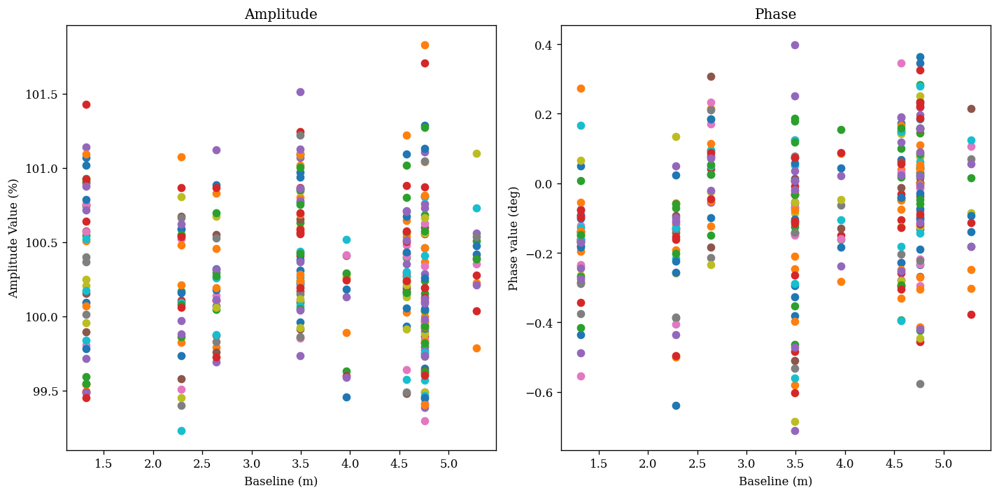

In [29]:
from amigo.vis_models import build_vis_pts

rs = np.hypot(*vis_model.bls.T)
bls_inds = vis_model.bls_inds

def get_vis(model, exposure):
    amplitudes = model.get(exposure.map_param("amplitudes"))
    phases = model.get(exposure.map_param("phases"))
    return build_vis_pts(amplitudes, phases, vis_model.knots[0].shape)

amplitude_vals = [np.abs(get_vis(final_model, exp)) for exp in exposures]
phase_vals = [dlu.rad2deg(np.angle(get_vis(final_model, exp))) for exp in exposures]

plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.title("Amplitude")
plt.xlabel("Baseline (m)")
plt.ylabel("Amplitude Value (%)")
for exp, amp in zip(exposures, amplitude_vals):
    plt.scatter(rs, 100 * amp[*bls_inds])

plt.subplot(1, 2, 2)
plt.title("Phase")
plt.xlabel("Baseline (m)")
plt.ylabel("Phase value (deg)")
for exp, phase in zip(exposures, phase_vals):
    plt.scatter(rs, phase[*bls_inds])

plt.tight_layout()
plt.show()

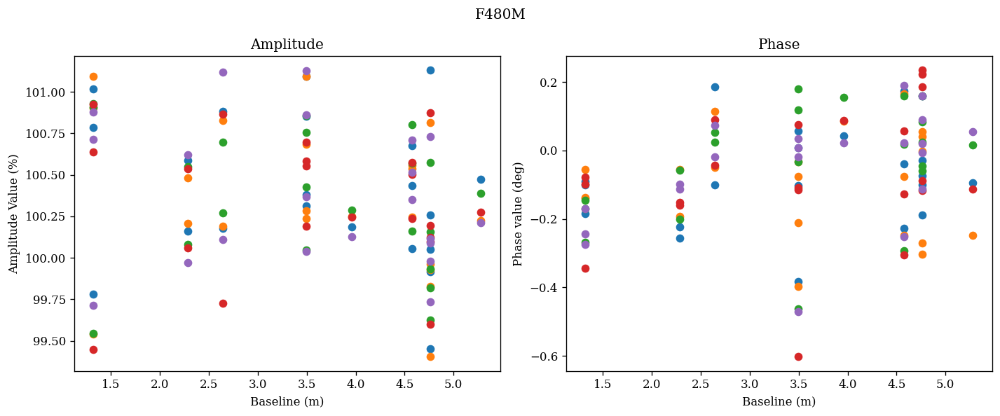

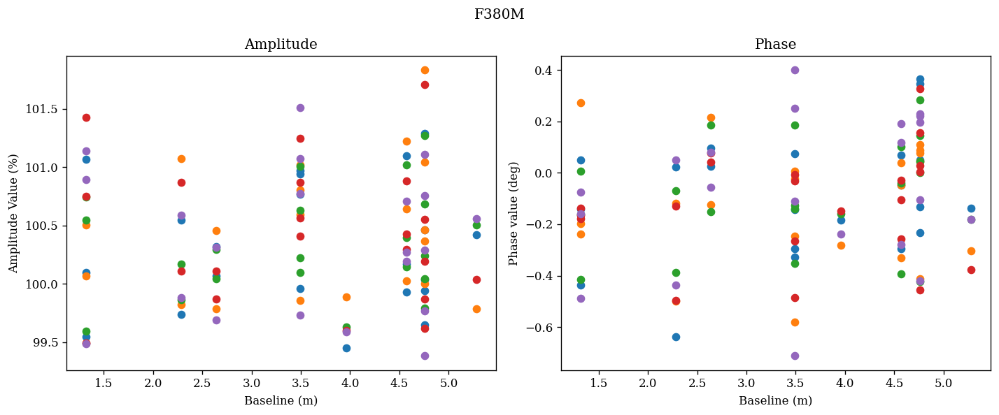

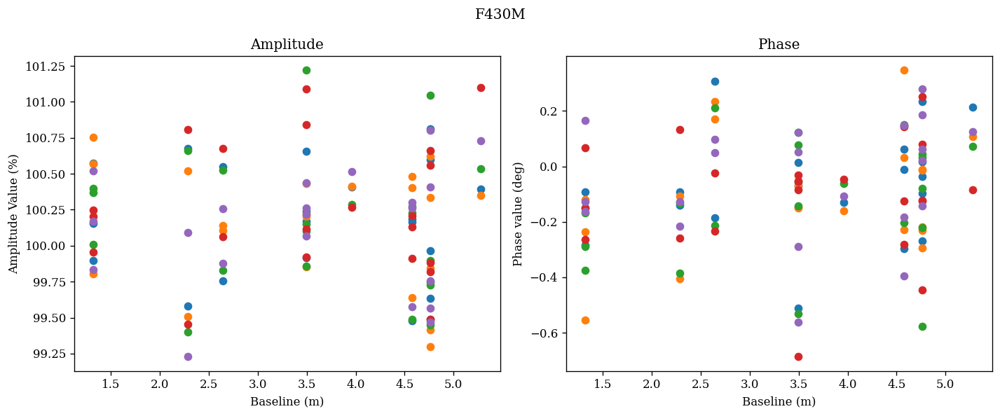

In [30]:
rs = np.hypot(*vis_model.bls.T)
bls_inds = vis_model.bls_inds

for filt in set([exp.filter for exp in exposures]):

    exps_in = [exp if exp.filter == filt else None for exp in exposures]
    skip = all([exp is None for exp in exps_in])
    if skip:
        continue

    plt.figure(figsize=(12, 5))
    plt.suptitle(filt)
    plt.subplot(1, 2, 1)
    plt.title("Amplitude")
    plt.xlabel("Baseline (m)")
    plt.ylabel("Amplitude Value (%)")
    for exp in exps_in:
        if exp is None:
            continue 

        amplitudes = np.abs(get_vis(final_model, exp))
        plt.scatter(rs, 100 * amplitudes[*bls_inds])

    plt.subplot(1, 2, 2)
    plt.title("Phase")
    plt.xlabel("Baseline (m)")
    plt.ylabel("Phase value (deg)")
    for exp in exps_in:
        if exp is None:
            continue 
        phases = dlu.rad2deg(np.angle(get_vis(final_model, exp)))
        plt.scatter(rs, phases[*bls_inds])

    plt.tight_layout()
    plt.show()

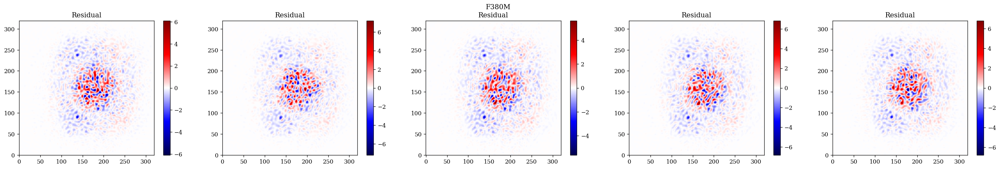

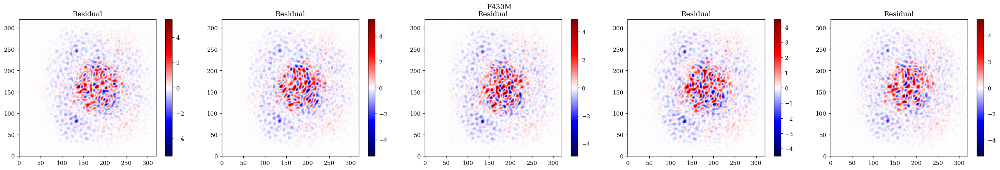

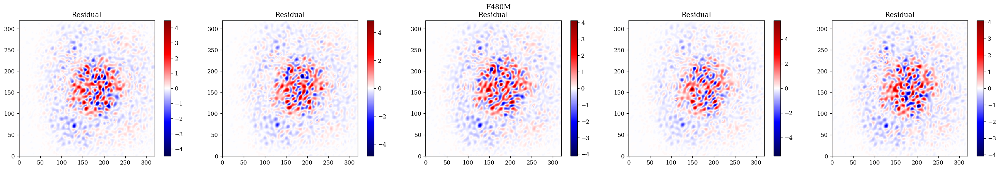

In [32]:
for filt in ["F380M", "F430M", "F480M"]:

    plt.figure(figsize=(25, 4))
    plt.suptitle(filt)
    idx = 1
    exps_in = [exp if exp.filter == filt else None for exp in exposures]
    for exp in exps_in:
        if exp is None:
            continue

        flux = 10 ** final_model.fluxes[exp.get_key("fluxes")]
        orig_psf = fit.model_psf(final_model, exp)
        new_psf = fit.model_vis(orig_psf, final_model, exp)

        orig_psf = flux * orig_psf.data
        new_psf = flux * new_psf.data

        plt.subplot(1, 5, idx)
        plt.title("Residual")
        res = orig_psf - new_psf
        v = np.abs(res).max()
        plt.imshow(res, cmap=seismic, vmin=-v, vmax=v)
        plt.colorbar()

        idx += 1
    plt.tight_layout()
    plt.show()

In [33]:
def get_vis(model, exposure):
    amplitudes = model.get(exposure.map_param("amplitudes"))
    phases = model.get(exposure.map_param("phases"))
    return build_vis_pts(amplitudes, phases, vis_model.knots[0].shape)


def nearest_fn(pt, coords):
    dist = np.hypot(*(coords - pt[:, None, None]))
    return dist == dist.min()


def convert_adjacent_to_true(bool_array, n=1, corners=False):
    for i in range(n):
        trues = np.array(np.where(bool_array))
        trues = np.swapaxes(trues, 0, 1)
        for i in range(len(trues)):
            y, x = trues[i]
            bool_array = bool_array.at[y, x + 1].set(True)
            bool_array = bool_array.at[y, x - 1].set(True)
            bool_array = bool_array.at[y + 1, x].set(True)
            bool_array = bool_array.at[y - 1, x].set(True)
            if corners:
                bool_array = bool_array.at[y + 1, x + 1].set(True)
                bool_array = bool_array.at[y - 1, x - 1].set(True)
                bool_array = bool_array.at[y + 1, x - 1].set(True)
                bool_array = bool_array.at[y - 1, x + 1].set(True)
    return bool_array

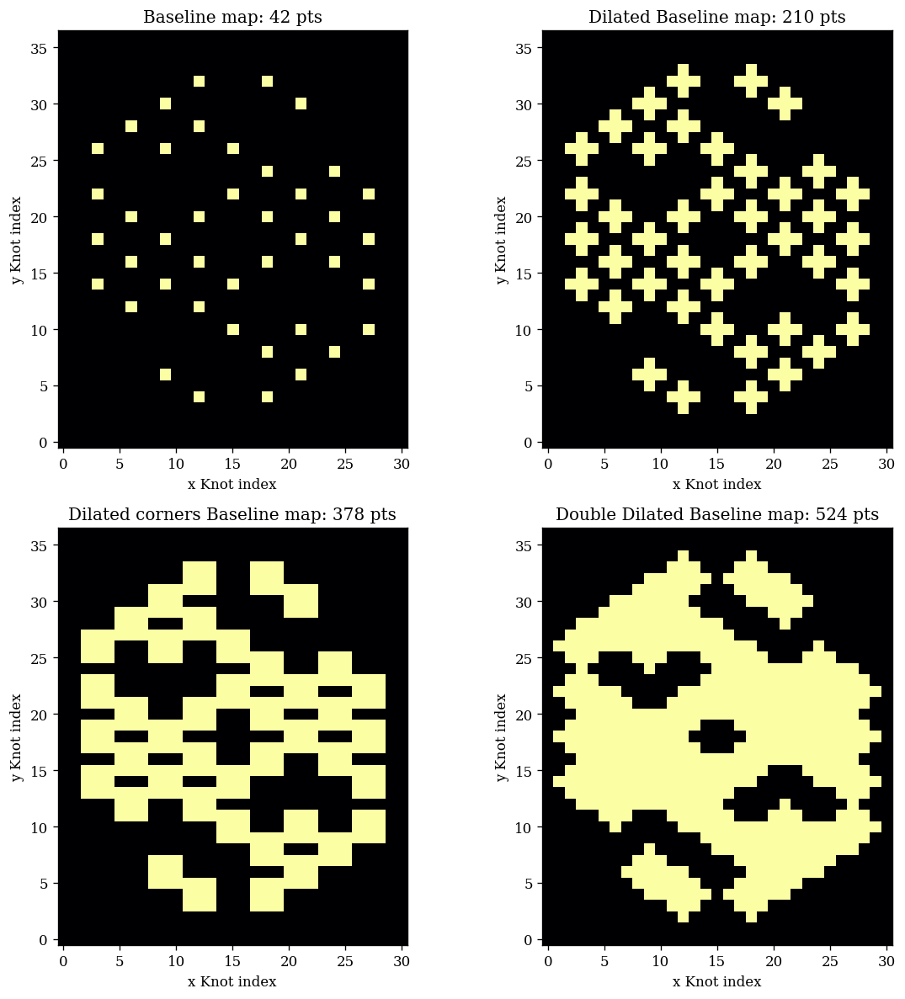

In [34]:
from jax import vmap

is_near = vmap(nearest_fn, (0, None))(vis_model.bls, vis_model.knots)
is_conj = vmap(nearest_fn, (0, None))(-vis_model.bls, vis_model.knots)

bls_map = np.sum(is_near.astype(int), 0) + np.sum(is_conj.astype(int), 0)
dilated_bls_map = convert_adjacent_to_true(bls_map.astype(bool))
double_dilated_bls_map = convert_adjacent_to_true(dilated_bls_map)
corner_bls_map = convert_adjacent_to_true(bls_map.astype(bool), corners=True)

plt.figure(figsize=(10, 10))
plt.subplot(2, 2, 1)
plt.title(f"Baseline map: {bls_map.sum()} pts")
plt.xlabel("x Knot index")
plt.ylabel("y Knot index")
plt.imshow(bls_map)

plt.subplot(2, 2, 2)
plt.title(f"Dilated Baseline map: {dilated_bls_map.sum()} pts")
plt.xlabel("x Knot index")
plt.ylabel("y Knot index")
plt.imshow(dilated_bls_map)

plt.subplot(2, 2, 3)
plt.title(f"Dilated corners Baseline map: {corner_bls_map.sum()} pts")
plt.xlabel("x Knot index")
plt.ylabel("y Knot index")
plt.imshow(corner_bls_map)

plt.subplot(2, 2, 4)
plt.title(f"Double Dilated Baseline map: {double_dilated_bls_map.sum()} pts")
plt.xlabel("x Knot index")
plt.ylabel("y Knot index")
plt.imshow(double_dilated_bls_map)

plt.tight_layout()
plt.show()

flat_bls_inds = np.array(np.where(bls_map.flatten()))[:, : bls_map.sum() // 2]
flat_bls_inds_dilate = np.array(np.where(dilated_bls_map.flatten()))[
    :, : dilated_bls_map.sum() // 2
]
flat_bls_inds_double_dilate = np.array(np.where(double_dilated_bls_map.flatten()))[
    :, : double_dilated_bls_map.sum() // 2
]
flat_bls_inds_corner = np.array(np.where(corner_bls_map.flatten()))[
    :, : corner_bls_map.sum() // 2
]

In [35]:
import time
from amigo.stats import posterior
from amigo.fisher import hessian
from tqdm.notebook import tqdm

inds_in = flat_bls_inds
N = len(inds_in[0])
X = np.zeros(N)

amp_fishers = {}
pha_fishers = {}
for exp in tqdm(exposures):

    # Build function to calculate FIM and calculate
    def amp_loglike(X):
        amplitudes = final_model.amplitudes[exp.key].at[*inds_in].add(X)
        pytree = final_model.set(f"amplitudes.{exp.key}", amplitudes)
        return posterior(pytree, exp, per_pix=False)

    def pha_loglike(X):
        phases = final_model.phases[exp.key].at[*inds_in].add(X)
        pytree = final_model.set(f"phases.{exp.key}", phases)
        return posterior(pytree, exp, per_pix=False)

    amp_fishers[exp.key] = hessian(amp_loglike, X)
    pha_fishers[exp.key] = hessian(pha_loglike, X)


  0%|          | 0/15 [00:00<?, ?it/s]

In [36]:
import time
from amigo.stats import posterior
from amigo.fisher import hessian
from tqdm.notebook import tqdm

inds_in = flat_bls_inds
N = len(inds_in[0])
X = np.zeros(N)

photon_amp_fishers = {}
photon_pha_fishers = {}
for exp in tqdm(exposures):

    # Test photon noise limit
    model_slopes = final_model.model(exp)
    exp = exp.set('slopes', model_slopes)

    # Build function to calculate FIM and calculate
    def amp_loglike(X):
        amplitudes = final_model.amplitudes[exp.key].at[*inds_in].add(X)
        pytree = final_model.set(f"amplitudes.{exp.key}", amplitudes)
        return posterior(pytree, exp, per_pix=False)

    def pha_loglike(X):
        phases = final_model.phases[exp.key].at[*inds_in].add(X)
        pytree = final_model.set(f"phases.{exp.key}", phases)
        return posterior(pytree, exp, per_pix=False)

    photon_amp_fishers[exp.key] = hessian(amp_loglike, X)
    photon_pha_fishers[exp.key] = hessian(pha_loglike, X)


  0%|          | 0/15 [00:00<?, ?it/s]

In [37]:
import jax.tree_util as jtu

amp_errs = jtu.tree_map(lambda x: np.diag(-np.linalg.inv(x)) ** 0.5, amp_fishers)
pha_errs = jtu.tree_map(lambda x: np.diag(-np.linalg.inv(x)) ** 0.5, pha_fishers)
vis_err = jtu.tree_map(lambda amp, pha: amp * np.exp(1j * pha), amp_errs, pha_errs)


photon_amp_errs = jtu.tree_map(lambda x: np.diag(-np.linalg.inv(x)) ** 0.5, photon_amp_fishers)
photon_pha_errs = jtu.tree_map(lambda x: np.diag(-np.linalg.inv(x)) ** 0.5, photon_pha_fishers)
photon_vis_err = jtu.tree_map(lambda amp, pha: amp * np.exp(1j * pha), photon_amp_errs, photon_pha_errs)

In [38]:
import jax.tree_util as jtu

import numpy as onp
from uncertainties import ufloat


def vis2ufloat(vis, err):
    amp = onp.array([ufloat(np.abs(a), np.abs(e)) for a, e in zip(vis, err)])
    pha = onp.array([ufloat(np.abs(a), np.abs(e)) for a, e in zip(vis, err)])
    return amp, pha


def ufloat2jax(arr):
    vals = np.array([v.nominal_value for v in arr])
    errs = np.array([v.std_dev for v in arr])
    return vals, errs


def add_vis_errs(vis_list, vis_err_list):
    amps = [vis2ufloat(vis, err)[0] for vis, err in zip(vis_list, vis_err_list)]
    phas = [vis2ufloat(vis, err)[1] for vis, err in zip(vis_list, vis_err_list)]

    amp, amp_err = ufloat2jax(onp.array(amps).mean(0))
    pha, pha_err = ufloat2jax(onp.array(phas).mean(0))

    mean_vis = amp * np.exp(1j * pha)
    mean_vis_err = amp_err * np.exp(1j * pha_err)
    return mean_vis, mean_vis_err


def calibrate_vis(sci_vis, sci_vis_err, cal_vis, cal_vis_err):
    sci_amp, sci_pha = vis2ufloat(sci_vis, sci_vis_err)
    cal_amp, cal_pha = vis2ufloat(cal_vis, cal_vis_err)

    calib_amp, calib_amp_err = ufloat2jax(sci_amp / cal_amp)
    calib_pha, calib_pha_err = ufloat2jax(sci_pha - cal_pha)

    calib_vis = calib_amp * np.exp(1j * calib_pha)
    calib_vis_err = calib_amp_err * np.exp(1j * calib_pha_err)
    return calib_vis, calib_vis_err

In [39]:
# Divide into filters
exp_filters = {}
for exp in exposures:
    if exp.filter not in exp_filters.keys():
        exp_filters[exp.filter] = [exp]
    else:
        exp_filters[exp.filter].append(exp)

# Calibrate
calibrated_vis = {
    "F380M": {},
    "F430M": {},
    "F480M": {},
}

calibrated_vis_err = {
    "F380M": {},
    "F430M": {},
    "F480M": {},
}

photon_calibrated_vis_err = {
    "F380M": {},
    "F430M": {},
    "F480M": {},
}

for filt, exps_in in exp_filters.items():
    for i, sci_exp in enumerate(exps_in):
        vis_in, err_in, photon_err_in = [], [], []
        for j, cal_exp in enumerate(exps_in):
            if i == j:
                continue
            vis_in.append(get_vis(final_model, cal_exp)[*vis_model.bls_inds])
            err_in.append(vis_err[cal_exp.key])
            photon_err_in.append(photon_vis_err[cal_exp.key])
        cal_vis, cal_vis_err = add_vis_errs(vis_in, err_in)
        _, photon_cal_vis_err = add_vis_errs(vis_in, photon_err_in)

        sci_vis = get_vis(final_model, sci_exp)[*vis_model.bls_inds]
        sci_vis_err = vis_err[sci_exp.key]
        photon_sci_vis_err = photon_vis_err[sci_exp.key]
        calib_vis, calib_vis_err = calibrate_vis(sci_vis, sci_vis_err, cal_vis, cal_vis_err)
        _, photon_calib_vis_err = calibrate_vis(
            sci_vis, photon_sci_vis_err, cal_vis, photon_cal_vis_err
        )

        calibrated_vis[filt][sci_exp.key] = calib_vis
        calibrated_vis_err[filt][sci_exp.key] = calib_vis_err
        photon_calibrated_vis_err[filt][sci_exp.key] = photon_calib_vis_err

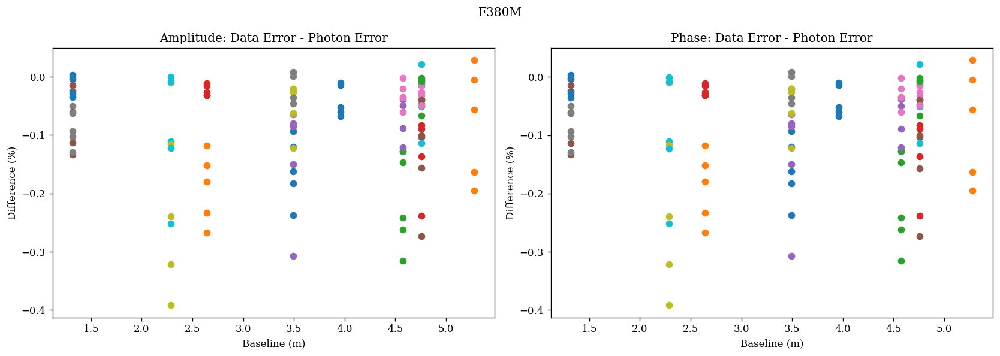

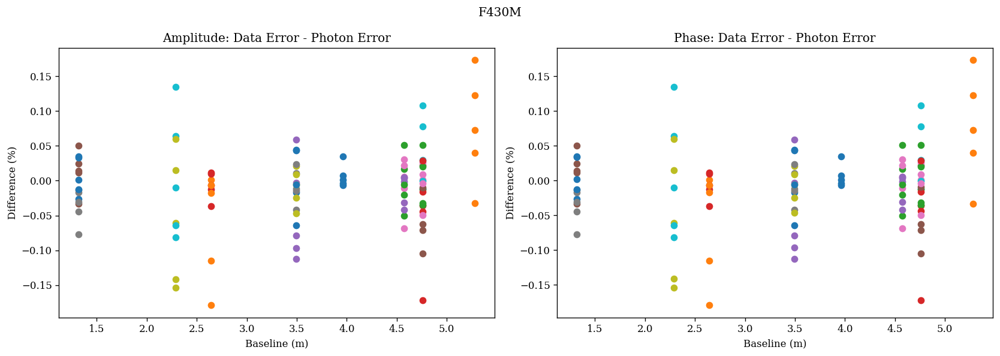

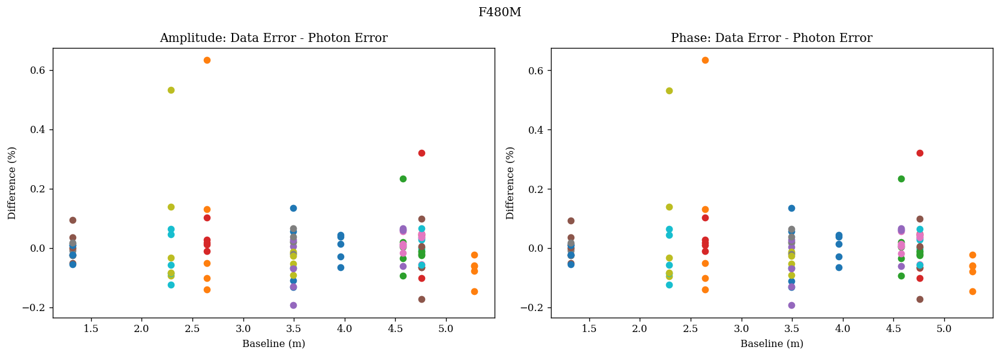

In [43]:
errorbar = lambda xs, ys, err, **kwargs: plt.errorbar(
    xs, ys, yerr=err, marker="o", capsize=5, linestyle="", **kwargs
)
cols = [
    "tab:blue",
    "tab:orange",
    "tab:green",
    "tab:red",
    "tab:purple",
    "tab:brown",
    "tab:pink",
    "tab:gray",
    "tab:olive",
    "tab:cyan",
]

ratio = 1 / 0.85

for filt in calibrated_vis.keys():
    vis_dict = calibrated_vis[filt]
    err_dict = calibrated_vis_err[filt]
    photon_dict = photon_calibrated_vis_err[filt]

    plt.figure(figsize=(14, 5))
    plt.suptitle(filt)
    plt.subplot(1, 2, 1)
    plt.title("Amplitude: Data Error - Photon Error")
    plt.xlabel("Baseline (m)")
    plt.ylabel("Difference (%)")
    for i, (vis, err, photon_err) in enumerate(
        zip(vis_dict.values(), err_dict.values(), photon_dict.values())
    ):
        amp = np.abs(vis)
        amp_err = ratio * np.abs(err)
        photon_amp_err = ratio * np.abs(photon_err)

        scatter, mean_err = amp.std(), amp_err.mean()
        err_ratio = scatter / mean_err
        for j in range(len(amp)):
            res = (amp_err[j] - photon_amp_err[j]) / photon_amp_err[j]
            plt.scatter(rs[j], 100 * res, c=cols[j % 10])

    plt.subplot(1, 2, 2)
    plt.title("Phase: Data Error - Photon Error")
    plt.xlabel("Baseline (m)")
    plt.ylabel("Difference (%)")
    for vis, err, photon_err in zip(
        vis_dict.values(), err_dict.values(), photon_dict.values()
    ):
        pha = dlu.rad2deg(np.angle(vis))
        pha_err = ratio * dlu.rad2deg(np.angle(err))
        photon_pha_err = ratio * dlu.rad2deg(np.angle(photon_err))

        scatter, mean_err = pha.std(), pha_err.mean()
        err_ratio = scatter / mean_err
        for j in range(len(amp)):
            res = (pha_err[j] - photon_pha_err[j]) / photon_pha_err[j]
            plt.scatter(rs[j], 100 * res, c=cols[j % 10])

    plt.tight_layout()
    plt.show()

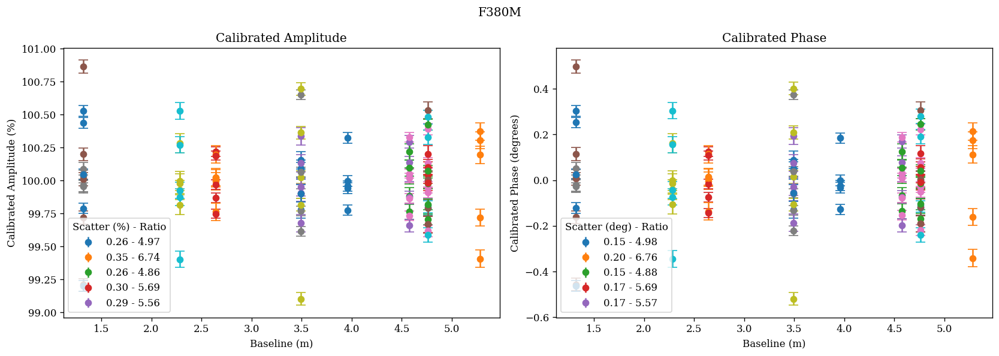

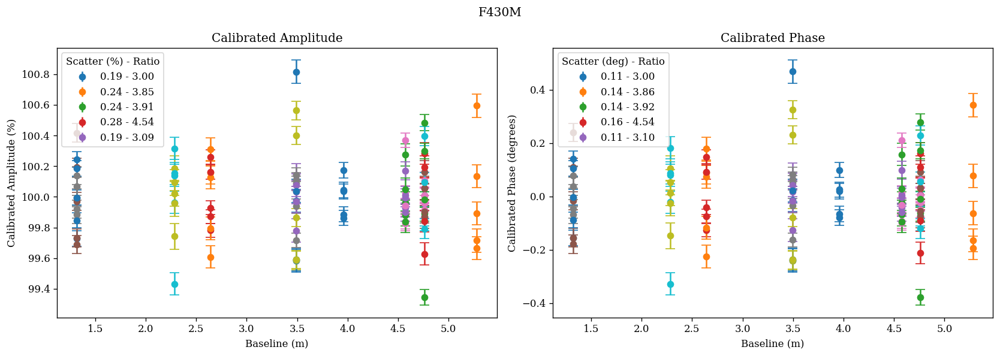

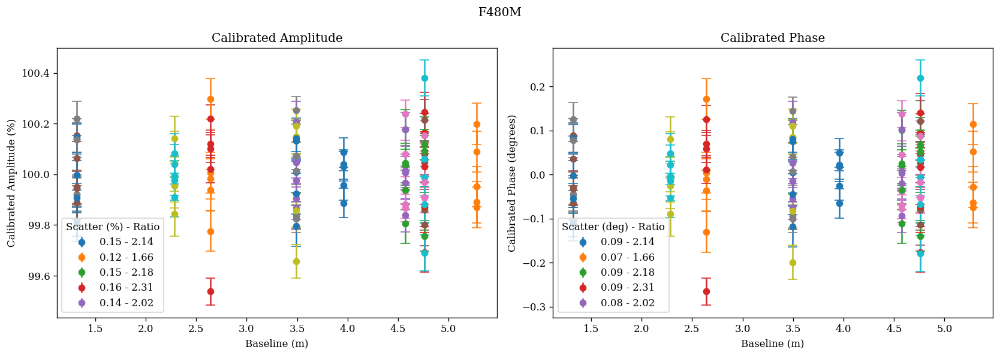

In [44]:
errorbar = lambda xs, ys, err, **kwargs: plt.errorbar(
    xs, ys, yerr=err, marker='o', capsize=5, linestyle="", **kwargs
)
# markers = ["o", "v", "x", ">", "<", "s", "1", "2", "+", "d"]
cols = [
    "tab:blue",
    "tab:orange",
    "tab:green",
    "tab:red",
    "tab:purple",
    "tab:brown",
    "tab:pink",
    "tab:gray",
    "tab:olive",
    "tab:cyan",
]

ratio = 1 / 0.85

for filt in calibrated_vis.keys():
    vis_dict = calibrated_vis[filt]
    err_dict = calibrated_vis_err[filt]

    plt.figure(figsize=(14, 5))
    plt.suptitle(filt)
    plt.subplot(1, 2, 1)
    plt.title("Calibrated Amplitude")
    plt.xlabel("Baseline (m)")
    plt.ylabel("Calibrated Amplitude (%)")
    for i, (vis, err) in enumerate(zip(vis_dict.values(), err_dict.values())):
        amp = 100 * np.abs(vis)
        amp_err = ratio * 100 * np.abs(err)

        scatter, mean_err = amp.std(), amp_err.mean()
        err_ratio = scatter / mean_err
        for j in range(len(amp)):
            errorbar(rs[j], amp[j], amp_err[j], c=cols[j % 10])
        errorbar([], [], [], label=f"{scatter:.2f} - {err_ratio:.2f}")
    plt.legend(title="Scatter (%) - Ratio")

    plt.subplot(1, 2, 2)
    plt.title("Calibrated Phase")
    plt.xlabel("Baseline (m)")
    plt.ylabel("Calibrated Phase (degrees)")
    for vis, err in zip(vis_dict.values(), err_dict.values()):
        pha = dlu.rad2deg(np.angle(vis))
        pha_err = ratio * dlu.rad2deg(np.angle(err))

        scatter, mean_err = pha.std(), pha_err.mean()
        err_ratio = scatter / mean_err
        for j in range(len(amp)):
            errorbar(rs[j], pha[j], pha_err[j], c=cols[j % 10])
        errorbar([], [], [], label=f"{scatter:.2f} - {err_ratio:.2f}")

    plt.legend(title="Scatter (deg) - Ratio")

    plt.tight_layout()
    plt.show()

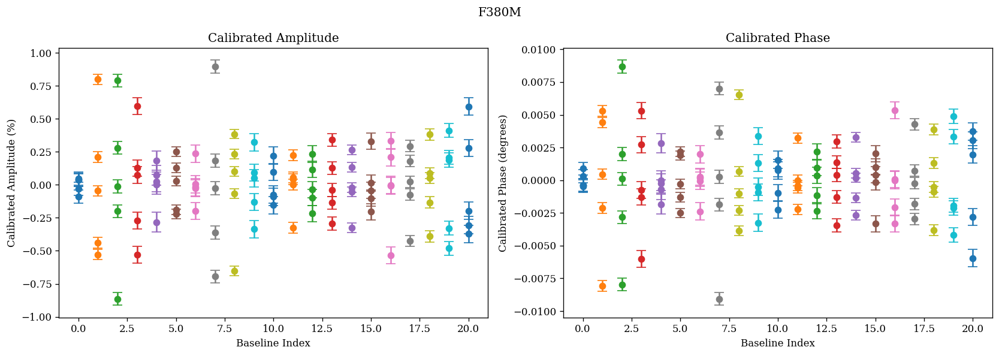

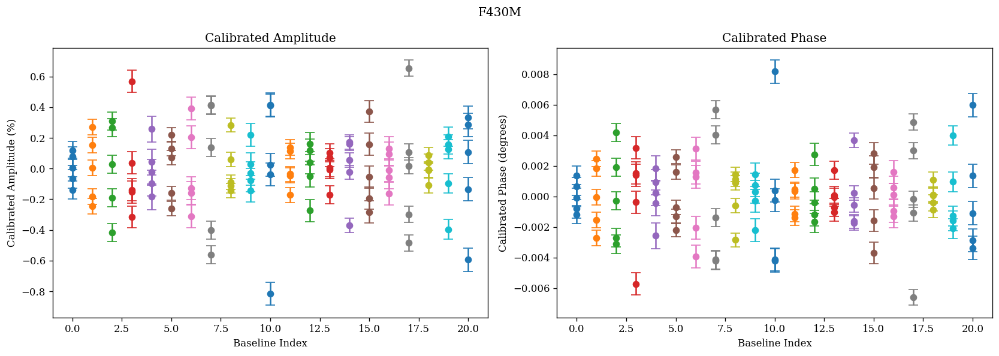

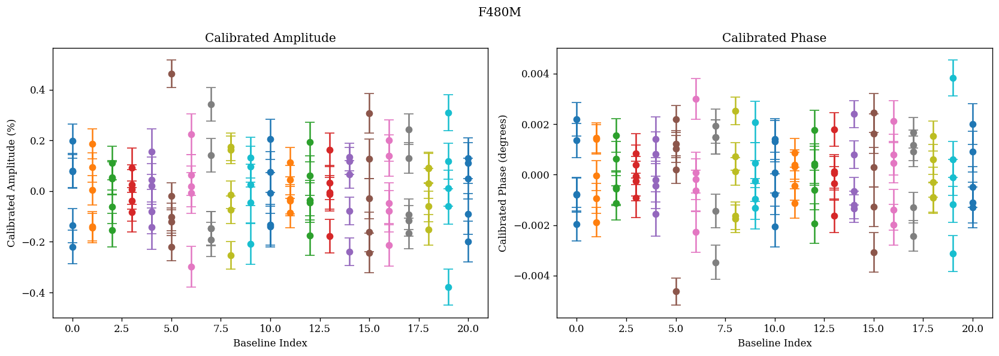

In [45]:
errorbar = lambda xs, ys, err, **kwargs: plt.errorbar(
    xs, ys, yerr=err, marker="o", capsize=5, linestyle="", **kwargs
)

ratio = 1 / 0.85
r_ordered = np.argsort(rs)

for filt in calibrated_vis.keys():
    vis_dict = calibrated_vis[filt]
    err_dict = calibrated_vis_err[filt]

    plt.figure(figsize=(14, 5))
    plt.suptitle(filt)
    plt.subplot(1, 2, 1)
    plt.title("Calibrated Amplitude")
    plt.xlabel("Baseline Index")
    plt.ylabel("Calibrated Amplitude (%)")

    all_vis = np.array(jtu.tree_leaves(vis_dict)).T[r_ordered]
    all_err = np.array(jtu.tree_leaves(err_dict)).T[r_ordered]

    for i in range(len(all_vis)):
        bl = 100 * (1 - np.abs(all_vis[i]))
        bl_err = 100 * ratio * np.abs(all_err[i])
        errorbar(np.ones(len(bl)) * i, bl, bl_err)

    plt.subplot(1, 2, 2)
    plt.title("Calibrated Phase")
    plt.xlabel("Baseline Index")
    plt.ylabel("Calibrated Phase (degrees)")
    for i in range(len(all_vis)):
        bl = np.angle(all_vis[i])
        bl_err = ratio * np.angle(all_err[i])
        errorbar(np.ones(len(bl)) * i, bl, bl_err)

    plt.tight_layout()
    plt.show()

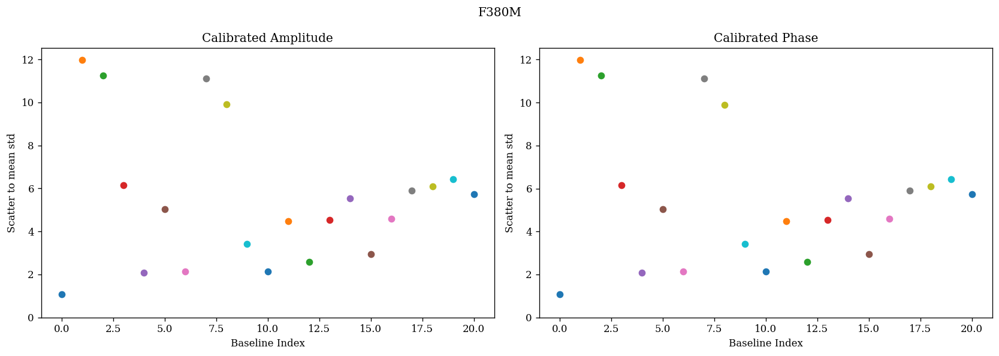

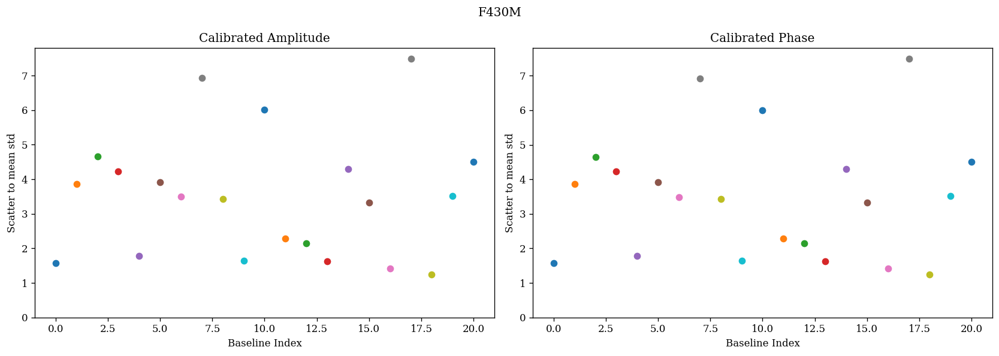

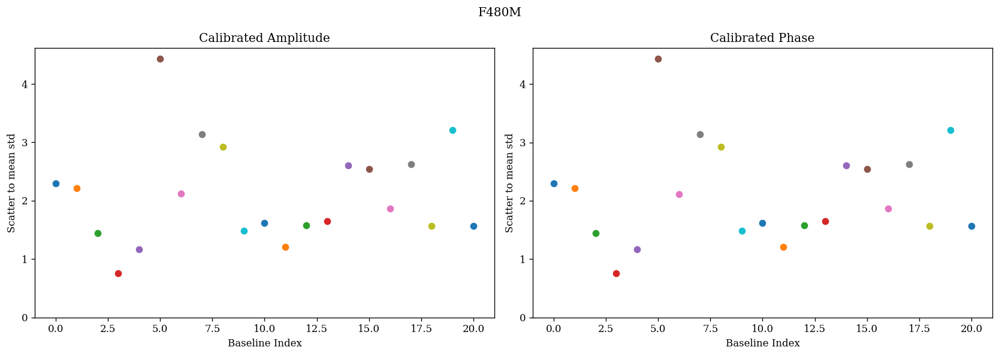

In [46]:
errorbar = lambda xs, ys, err, **kwargs: plt.errorbar(
    xs, ys, yerr=err, marker="o", capsize=5, linestyle="", **kwargs
)

ratio = 1 / 0.85
r_ordered = np.argsort(rs)

for filt in calibrated_vis.keys():
    vis_dict = calibrated_vis[filt]
    err_dict = calibrated_vis_err[filt]

    plt.figure(figsize=(14, 5))
    plt.suptitle(filt)
    plt.subplot(1, 2, 1)
    plt.title("Calibrated Amplitude")
    plt.xlabel("Baseline Index")
    plt.ylabel("Scatter to mean std")
    all_vis = np.array(jtu.tree_leaves(vis_dict)).T[r_ordered]
    all_err = np.array(jtu.tree_leaves(err_dict)).T[r_ordered]

    for i in range(len(all_vis)):
        bl = 100 * (1 - np.abs(all_vis[i]))
        bl_err = 100 * ratio * np.abs(all_err[i])
        plt.scatter(i, bl.std() / bl_err.mean())
    plt.ylim(0)

    plt.subplot(1, 2, 2)
    plt.title("Calibrated Phase")
    plt.xlabel("Baseline Index")
    plt.ylabel("Scatter to mean std")
    for i in range(len(all_vis)):
        bl = np.angle(all_vis[i])
        bl_err = ratio * np.angle(all_err[i])
        plt.scatter(i, bl.std() / bl_err.mean())
    plt.ylim(0)

    plt.tight_layout()
    plt.show()

In [47]:
# from zodiax.experimental import serialise

# serialise("files/new_calibration/reg_history.zdx", histories[0])
# serialise("files/new_calibration/batch_history.zdx", histories[1])